#  Healthy Home Prediction and Map Visualization

## 1. Set Environment & Libraries

In [225]:
# timer
import time
from tqdm import tqdm, tqdm_notebook

# Data manipulation libraries
import os
import pandas as pd
import numpy as np

# Visualization
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns

import pandas_profiling


# Feature engineering
from sklearn import model_selection
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler


# Modelling
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LinearRegression, Lasso, Ridge  
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import AdaBoostRegressor
from xgboost import XGBRegressor
from sklearn.neighbors import KNeighborsRegressor


# Model evaluation
from sklearn import metrics
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score

from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.inspection import permutation_importance

# Geo-related libraries
import geopandas as gpd
import osmnx as ox
import folium
from folium.plugins import HeatMap
import geopy
from geopy.geocoders import Nominatim
from geopy.extra.rate_limiter import RateLimiter
import contextily as ctx
import geofeather
from geopandas import GeoDataFrame
from shapely.geometry import Point
from shapely import wkt
from shapely.geometry import Point, MultiPoint
from shapely.ops import nearest_points
from shapely import wkt

import warnings
warnings.filterwarnings('ignore')

## 2. Load Data

In [226]:
# Air pollution and health info
df_home = pd.read_csv('/Users/songyarong/Workspace/5. Project/12. Healthy home/Home_n_Map.csv')

In [227]:
df_home.head()

,NO value,NO2 value,PM2p5 value,geometry,road_type,zone,tract_name,GEOID,state,county,pop_den,wind,temp,Longitude,Latitude,Respiratory_HI,Pt_CANCR
0,23.390071,17.539762,17.612700,POINT (-122.3225938 37.80678062),tertiary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,8.336845,4.133333,14.950001,-122.322594,37.806781,high,0.7 - 0.8
1,19.700000,19.956750,15.946719,POINT (-122.32231 37.80614989),secondary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,8.336845,4.133333,14.950001,-122.322310,37.806150,high,0.7 - 0.8
2,23.611111,23.967768,16.210698,POINT (-122.3223008 37.80642014),secondary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,8.336845,4.133333,14.950001,-122.322301,37.806420,high,0.7 - 0.8
3,15.714285,18.435184,15.561862,POINT (-122.3222988 37.80587979999999),secondary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,8.336845,4.133333,14.950001,-122.322299,37.805880,high,0.7 - 0.8
4,27.108695,25.797037,17.120884,POINT (-122.3222671 37.80668898),secondary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,8.336845,4.133333,14.950001,-122.322267,37.806689,high,0.7 - 0.8


- Air pollution: NO, NO2, PM2.5
- Geometry, road_type, zone
- wind, temp
- Health related: Respiratory_HI, Pt_CANCR

In [228]:
df_home.shape

(18286, 17)

## 3. Data Exploration

### 3.1 Profile Report

In [229]:
# pandas_profiling.ProfileReport(fraud_data)
pandas_profiling.ProfileReport(df_home, title="Pandas Profiling Report", vars={"num": {"low_categorical_threshold": 0}})

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

- 17 variables: 11 numeric and 6 categorical
- Constant features to drop: state, county
- Missing cells: 80
- Duplicates: 3 rows
- Highly correlated features

### 3.2 General info

In [230]:
df_home.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18286 entries, 0 to 18285
Data columns (total 17 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   NO value        18286 non-null  float64
 1   NO2 value       18286 non-null  float64
 2   PM2p5 value     18286 non-null  float64
 3   geometry        18286 non-null  object 
 4   road_type       18286 non-null  object 
 5   zone            18238 non-null  object 
 6   tract_name      18286 non-null  object 
 7   GEOID           18286 non-null  int64  
 8   state           18286 non-null  int64  
 9   county          18286 non-null  int64  
 10  pop_den         18286 non-null  float64
 11  wind            18270 non-null  float64
 12  temp            18270 non-null  float64
 13  Longitude       18286 non-null  float64
 14  Latitude        18286 non-null  float64
 15  Respiratory_HI  18286 non-null  object 
 16  Pt_CANCR        18286 non-null  object 
dtypes: float64(8), int64(3), object

In [231]:
df_home.isnull().sum()

NO value           0
NO2 value          0
PM2p5 value        0
geometry           0
road_type          0
zone              48
tract_name         0
GEOID              0
state              0
county             0
pop_den            0
wind              16
temp              16
Longitude          0
Latitude           0
Respiratory_HI     0
Pt_CANCR           0
dtype: int64

### 3.3 Mapping
- EPSG: 4326 uses a coordinate system on the surface of a sphere or ellipsoid of reference.
- EPSG: 3857 uses a coordinate system PROJECTED from the surface of the sphere.

- EPSG 4326 uses a coordinate system the same as a GLOBE (curved surface). 
- EPSG 3857 uses a coordinate system the same as a MAP (flat surface).


In [232]:
# Convert pandas df to geopandas df (based on latitude & longitude)
# European Petroleum Survey Group-EPSG
gpd_degree_1 = gpd.GeoDataFrame(df_home, geometry=gpd.points_from_xy(df_home.Longitude, df_home.Latitude), crs={'init' :'epsg:4326'})

# gpd_degree_1 = gpd.GeoDataFrame(df_home, geometry=df_home['geometry'], crs={'init' :'epsg:4326'})

In [233]:
gpd_degree_1.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 18286 entries, 0 to 18285
Data columns (total 17 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   NO value        18286 non-null  float64 
 1   NO2 value       18286 non-null  float64 
 2   PM2p5 value     18286 non-null  float64 
 3   geometry        18286 non-null  geometry
 4   road_type       18286 non-null  object  
 5   zone            18238 non-null  object  
 6   tract_name      18286 non-null  object  
 7   GEOID           18286 non-null  int64   
 8   state           18286 non-null  int64   
 9   county          18286 non-null  int64   
 10  pop_den         18286 non-null  float64 
 11  wind            18270 non-null  float64 
 12  temp            18270 non-null  float64 
 13  Longitude       18286 non-null  float64 
 14  Latitude        18286 non-null  float64 
 15  Respiratory_HI  18286 non-null  object  
 16  Pt_CANCR        18286 non-null  object  
dtypes: f

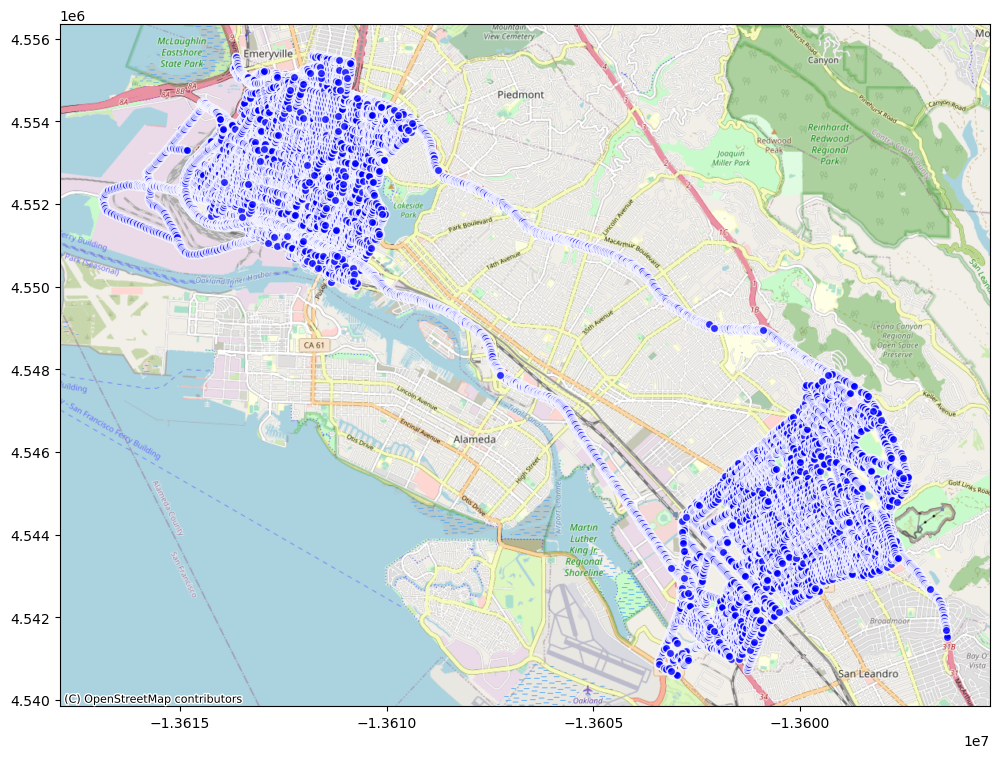

In [234]:
# Mapping data points
fig, ax = plt.subplots(figsize=(12, 10))

# Transform geometries to a new coordinate reference system; EPSG code specifying output projection
# reproject it in Web mercator: to_crs(epsg=3857)
gpd_degree_1.to_crs(epsg=3857).plot(ax=ax, markersize=35, color='blue', edgecolor='white', alpha=0.8)

# Add base map using contextily(tile maps)
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

## 4. Data Cleaning
Processing on pd DataFrame

In [235]:
df_home.head()

,NO value,NO2 value,PM2p5 value,geometry,road_type,zone,tract_name,GEOID,state,county,pop_den,wind,temp,Longitude,Latitude,Respiratory_HI,Pt_CANCR
0,23.390071,17.539762,17.612700,POINT (-122.32259 37.80678),tertiary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,8.336845,4.133333,14.950001,-122.322594,37.806781,high,0.7 - 0.8
1,19.700000,19.956750,15.946719,POINT (-122.32231 37.80615),secondary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,8.336845,4.133333,14.950001,-122.322310,37.806150,high,0.7 - 0.8
2,23.611111,23.967768,16.210698,POINT (-122.32230 37.80642),secondary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,8.336845,4.133333,14.950001,-122.322301,37.806420,high,0.7 - 0.8
3,15.714285,18.435184,15.561862,POINT (-122.32230 37.80588),secondary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,8.336845,4.133333,14.950001,-122.322299,37.805880,high,0.7 - 0.8
4,27.108695,25.797037,17.120884,POINT (-122.32227 37.80669),secondary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,8.336845,4.133333,14.950001,-122.322267,37.806689,high,0.7 - 0.8


### 4.1 Rename

In [236]:
df_home = df_home.rename(columns={'NO value': 'NO'})
df_home = df_home.rename(columns={'NO2 value': 'NO2'})
df_home = df_home.rename(columns={'PM2p5 value': 'PM2p5'})

In [237]:
df_home.head()

,NO,NO2,PM2p5,geometry,road_type,zone,tract_name,GEOID,state,county,pop_den,wind,temp,Longitude,Latitude,Respiratory_HI,Pt_CANCR
0,23.390071,17.539762,17.612700,POINT (-122.32259 37.80678),tertiary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,8.336845,4.133333,14.950001,-122.322594,37.806781,high,0.7 - 0.8
1,19.700000,19.956750,15.946719,POINT (-122.32231 37.80615),secondary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,8.336845,4.133333,14.950001,-122.322310,37.806150,high,0.7 - 0.8
2,23.611111,23.967768,16.210698,POINT (-122.32230 37.80642),secondary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,8.336845,4.133333,14.950001,-122.322301,37.806420,high,0.7 - 0.8
3,15.714285,18.435184,15.561862,POINT (-122.32230 37.80588),secondary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,8.336845,4.133333,14.950001,-122.322299,37.805880,high,0.7 - 0.8
4,27.108695,25.797037,17.120884,POINT (-122.32227 37.80669),secondary,industrial,"Census Tract 9819, Alameda County, California",6001981900,6,1,8.336845,4.133333,14.950001,-122.322267,37.806689,high,0.7 - 0.8


### 4.2 Drop Irrelevant Feature

In [238]:
print("*** Counts of Unique Values Each Feature")
print(df_home.nunique())

*** Counts of Unique Values Each Feature
NO                16015
NO2               18226
PM2p5             18281
geometry          18281
road_type             6
zone                  5
tract_name           73
GEOID                73
state                 1
county                1
pop_den              73
wind                 45
temp                 80
Longitude         18129
Latitude          18257
Respiratory_HI        3
Pt_CANCR              3
dtype: int64


In [239]:
# drop columns that only have one unique value
df_home_drop = df_home.drop(['state', 'county', 'tract_name', 'GEOID'], axis=1)
df_home_drop.head()

,NO,NO2,PM2p5,geometry,road_type,zone,pop_den,wind,temp,Longitude,Latitude,Respiratory_HI,Pt_CANCR
0,23.390071,17.539762,17.612700,POINT (-122.32259 37.80678),tertiary,industrial,8.336845,4.133333,14.950001,-122.322594,37.806781,high,0.7 - 0.8
1,19.700000,19.956750,15.946719,POINT (-122.32231 37.80615),secondary,industrial,8.336845,4.133333,14.950001,-122.322310,37.806150,high,0.7 - 0.8
2,23.611111,23.967768,16.210698,POINT (-122.32230 37.80642),secondary,industrial,8.336845,4.133333,14.950001,-122.322301,37.806420,high,0.7 - 0.8
3,15.714285,18.435184,15.561862,POINT (-122.32230 37.80588),secondary,industrial,8.336845,4.133333,14.950001,-122.322299,37.805880,high,0.7 - 0.8
4,27.108695,25.797037,17.120884,POINT (-122.32227 37.80669),secondary,industrial,8.336845,4.133333,14.950001,-122.322267,37.806689,high,0.7 - 0.8


### 4.3 Missing values

In [240]:
# Check missing data
df_home_drop.isnull().sum()

NO                 0
NO2                0
PM2p5              0
geometry           0
road_type          0
zone              48
pop_den            0
wind              16
temp              16
Longitude          0
Latitude           0
Respiratory_HI     0
Pt_CANCR           0
dtype: int64

In [241]:
# Handling missing data

# 1) Filling missing value with mean
df_home_drop['wind'] = df_home_drop['wind'].fillna(df_home_drop['wind'].mean())
df_home_drop['temp'] = df_home_drop['temp'].fillna(df_home_drop['temp'].mean())

# 2) Dropna
df_home_miss = df_home_drop.dropna(axis=0, subset=['zone'])

In [242]:
df_home_miss.isnull().sum()

NO                0
NO2               0
PM2p5             0
geometry          0
road_type         0
zone              0
pop_den           0
wind              0
temp              0
Longitude         0
Latitude          0
Respiratory_HI    0
Pt_CANCR          0
dtype: int64

In [243]:
# Reset index
df_home_miss = df_home_miss.reset_index()
df_home_miss

,index,NO,NO2,PM2p5,geometry,road_type,zone,pop_den,wind,temp,Longitude,Latitude,Respiratory_HI,Pt_CANCR
0,0,23.390071,17.539762,17.612700,POINT (-122.32259 37.80678),tertiary,industrial,8.336845,4.133333,14.950001,-122.322594,37.806781,high,0.7 - 0.8
1,1,19.700000,19.956750,15.946719,POINT (-122.32231 37.80615),secondary,industrial,8.336845,4.133333,14.950001,-122.322310,37.806150,high,0.7 - 0.8
2,2,23.611111,23.967768,16.210698,POINT (-122.32230 37.80642),secondary,industrial,8.336845,4.133333,14.950001,-122.322301,37.806420,high,0.7 - 0.8
3,3,15.714285,18.435184,15.561862,POINT (-122.32230 37.80588),secondary,industrial,8.336845,4.133333,14.950001,-122.322299,37.805880,high,0.7 - 0.8
4,4,27.108695,25.797037,17.120884,POINT (-122.32227 37.80669),secondary,industrial,8.336845,4.133333,14.950001,-122.322267,37.806689,high,0.7 - 0.8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18233,18281,9.733334,14.588807,9.333887,POINT (-122.25510 37.81945),motorway,residential,6241.318446,3.950000,15.049999,-122.255100,37.819452,low,< 0.4
18234,18282,12.857143,15.188906,11.007707,POINT (-122.23603 37.77631),motorway,mixed,2351.277070,4.091667,15.166668,-122.236032,37.776312,low,< 0.4
18235,18283,9.591837,15.566772,9.922039,POINT (-122.17888 37.78403),motorway,residential,2277.042655,3.833333,14.608333,-122.178876,37.784034,low,< 0.4
18236,18284,9.333333,9.039947,11.325624,POINT (-122.15509 37.77014),motorway,residential,1475.818172,3.766667,14.600001,-122.155090,37.770138,low,< 0.4


In [244]:
df_home_miss = df_home_miss.drop(['index'], axis=1)
df_home_miss.tail()

,NO,NO2,PM2p5,geometry,road_type,zone,pop_den,wind,temp,Longitude,Latitude,Respiratory_HI,Pt_CANCR
18233,9.733334,14.588807,9.333887,POINT (-122.25510 37.81945),motorway,residential,6241.318446,3.950000,15.049999,-122.255100,37.819452,low,< 0.4
18234,12.857143,15.188906,11.007707,POINT (-122.23603 37.77631),motorway,mixed,2351.277070,4.091667,15.166668,-122.236032,37.776312,low,< 0.4
18235,9.591837,15.566772,9.922039,POINT (-122.17888 37.78403),motorway,residential,2277.042655,3.833333,14.608333,-122.178876,37.784034,low,< 0.4
18236,9.333333,9.039947,11.325624,POINT (-122.15509 37.77014),motorway,residential,1475.818172,3.766667,14.600001,-122.155090,37.770138,low,< 0.4
18237,18.842105,16.122072,9.270166,POINT (-122.13903 37.73246),motorway,residential,486.040242,3.816667,15.041669,-122.139033,37.732464,low,< 0.4


In [245]:
df_home_miss.shape

(18238, 13)

### 4.4 Duplicates

In [246]:
# Extract duplicates
df_home_miss[df_home_miss.duplicated()]

,NO,NO2,PM2p5,geometry,road_type,zone,pop_den,wind,temp,Longitude,Latitude,Respiratory_HI,Pt_CANCR
184,32.059862,24.190178,19.514652,POINT (-122.30853 37.81503),secondary,industrial,220.026011,4.125000,15.000001,-122.308528,37.815028,high,0.7 - 0.8
514,16.426667,19.134740,18.727645,POINT (-122.30013 37.80641),secondary,mixed,3520.358174,4.083333,15.083335,-122.300129,37.806411,high,0.7 - 0.8
7176,92.638344,45.426999,28.987625,POINT (-122.23379 37.77509),motorway,mixed,2351.277070,4.091667,15.166668,-122.233788,37.775092,high,0.7 - 0.8


In [247]:
# Remove duplicated rows
df_home_dup = df_home_miss.drop_duplicates()

In [248]:
# Reset index (without. inplace= True, will generate a new df)
df_home_dup.reset_index(inplace=True)
df_home_dup.head(2)

,index,NO,NO2,PM2p5,geometry,road_type,zone,pop_den,wind,temp,Longitude,Latitude,Respiratory_HI,Pt_CANCR
0,0,23.390071,17.539762,17.612700,POINT (-122.32259 37.80678),tertiary,industrial,8.336845,4.133333,14.950001,-122.322594,37.806781,high,0.7 - 0.8
1,1,19.700000,19.956750,15.946719,POINT (-122.32231 37.80615),secondary,industrial,8.336845,4.133333,14.950001,-122.322310,37.806150,high,0.7 - 0.8


In [249]:
df_home_dup.tail(2)

,index,NO,NO2,PM2p5,geometry,road_type,zone,pop_den,wind,temp,Longitude,Latitude,Respiratory_HI,Pt_CANCR
18233,18236,9.333333,9.039947,11.325624,POINT (-122.15509 37.77014),motorway,residential,1475.818172,3.766667,14.600001,-122.155090,37.770138,low,< 0.4
18234,18237,18.842105,16.122072,9.270166,POINT (-122.13903 37.73246),motorway,residential,486.040242,3.816667,15.041669,-122.139033,37.732464,low,< 0.4


In [250]:
df_home_dup.shape

(18235, 14)

In [251]:
df_home_dup = df_home_dup.drop(['index'], axis=1)
df_home_dup.shape

(18235, 13)

In [252]:
# Check duplicates
df_home_dup[df_home_dup.duplicated()]

,NO,NO2,PM2p5,geometry,road_type,zone,pop_den,wind,temp,Longitude,Latitude,Respiratory_HI,Pt_CANCR


### 4.5 Outliers

<AxesSubplot:ylabel='temp'>

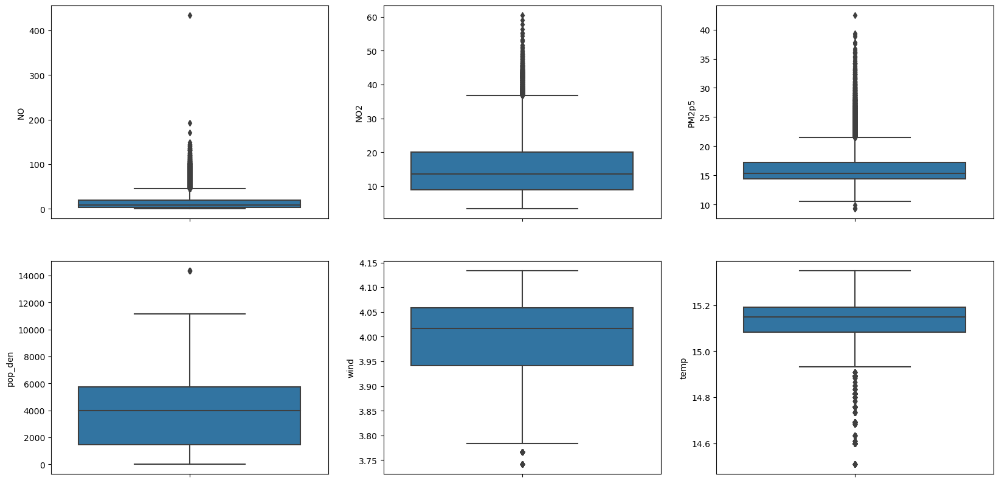

In [253]:
_, axss = plt.subplots(2, 3, figsize=[20,10])
sns.boxplot(y ='NO', data=df_home_dup, ax=axss[0, 0])
sns.boxplot(y ='NO2', data=df_home_dup, ax=axss[0, 1])
sns.boxplot(y ='PM2p5', data=df_home_dup, ax=axss[0, 2])
sns.boxplot(y ='pop_den', data=df_home_dup, ax=axss[1, 0])
sns.boxplot(y ='wind', data=df_home_dup, ax=axss[1, 1])
sns.boxplot(y ='temp', data=df_home_dup, ax=axss[1, 2])

In [254]:
df_home_dup.loc[df_home_miss['NO'] > 200, 'NO'] = 200

## 5. Feature Engineering

### 5.1 Oakland City

In [255]:
# Import oakland street and map data
Oakland = ox.geocode_to_gdf('Oakland, California')   
Oakland

,geometry,bbox_north,bbox_south,bbox_east,bbox_west,place_id,osm_type,osm_id,lat,lon,display_name,class,type,importance
0,"POLYGON ((-122.35588 37.83573, -122.35009 37.8...",37.885426,37.633676,-122.11442,-122.355881,282739798,relation,2833530,37.804456,-122.271356,"Oakland, Alameda County, California, United St...",boundary,administrative,0.851796


<AxesSubplot:>

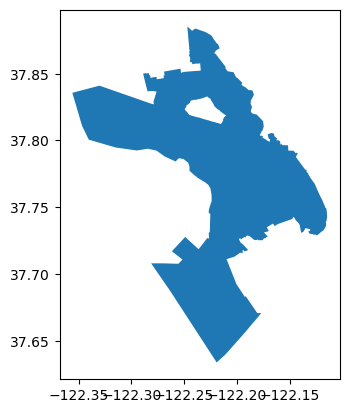

In [256]:
Oakland.plot()

#### 5.1.1 Convert geo
- crs: Coordinate Reference System

In [257]:
# Additinal city info
Oakland.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [258]:
# Project data
gpd_degree_1.crs

<Geographic 2D CRS: +init=epsg:4326 +type=crs>
Name: WGS 84
Axis Info [ellipsoidal]:
- lon[east]: Longitude (degree)
- lat[north]: Latitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [259]:
# Convert processed df to geogpd
gpd_degree_proc = gpd.GeoDataFrame(df_home_dup, geometry=df_home_dup['geometry'], crs={'init' :'epsg:4326'})

In [260]:
gpd_degree_proc.crs

<Geographic 2D CRS: +init=epsg:4326 +type=crs>
Name: WGS 84
Axis Info [ellipsoidal]:
- lon[east]: Longitude (degree)
- lat[north]: Latitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [261]:
gpd_degree_proc.head(2)

,NO,NO2,PM2p5,geometry,road_type,zone,pop_den,wind,temp,Longitude,Latitude,Respiratory_HI,Pt_CANCR
0,23.390071,17.539762,17.612700,POINT (-122.32259 37.80678),tertiary,industrial,8.336845,4.133333,14.950001,-122.322594,37.806781,high,0.7 - 0.8
1,19.700000,19.956750,15.946719,POINT (-122.32231 37.80615),secondary,industrial,8.336845,4.133333,14.950001,-122.322310,37.806150,high,0.7 - 0.8


In [262]:
gpd_degree_proc.shape

(18235, 13)

#### 5.1.2 Spatial-join: pollution & health and Oakland City

In [263]:
# spatial-join air pollution and health data with the Oakland polygon grid
gpd_city = gpd.sjoin(gpd_degree_proc, Oakland, how="inner", op="intersects")

In [264]:
gpd_city.head(2)

,NO,NO2,PM2p5,geometry,road_type,zone,pop_den,wind,temp,Longitude,...,bbox_west,place_id,osm_type,osm_id,lat,lon,display_name,class,type,importance
0,23.390071,17.539762,17.612700,POINT (-122.32259 37.80678),tertiary,industrial,8.336845,4.133333,14.950001,-122.322594,...,-122.355881,282739798,relation,2833530,37.804456,-122.271356,"Oakland, Alameda County, California, United St...",boundary,administrative,0.851796
1,19.700000,19.956750,15.946719,POINT (-122.32231 37.80615),secondary,industrial,8.336845,4.133333,14.950001,-122.322310,...,-122.355881,282739798,relation,2833530,37.804456,-122.271356,"Oakland, Alameda County, California, United St...",boundary,administrative,0.851796


In [265]:
print("*** Counts of Unique Values Each Feature")
print(gpd_city.nunique())

*** Counts of Unique Values Each Feature
NO                15976
NO2               18178
PM2p5             18233
geometry          18233
road_type             6
zone                  5
pop_den              70
wind                 46
temp                 81
Longitude         18082
Latitude          18209
Respiratory_HI        3
Pt_CANCR              3
index_right           1
bbox_north            1
bbox_south            1
bbox_east             1
bbox_west             1
place_id              1
osm_type              1
osm_id                1
lat                   1
lon                   1
display_name          1
class                 1
type                  1
importance            1
dtype: int64


In [266]:
gpd_city = gpd_city.drop(['index_right', 'bbox_north', 'bbox_south', 'bbox_east', 'bbox_west', 'place_id', 'osm_type', 'osm_id', 'lat', 'lon', 'display_name', 'class', 'type','importance'], axis=1)

### 5.2 City Structure: Roads

#### 5.2.1 City traffic intersections(nodes) and roads(edges)

In [267]:
# Street data: roads and intersections for the city
Oak_streets = ox.graph_from_place('Oakland, California', network_type='drive')  # graph
nodes, edges = ox.graph_to_gdfs(Oak_streets)

In [268]:
# traffic nodes
nodes.head(1)

,y,x,ref,highway,street_count,geometry
osmid,,,,,,
30362888,37.825844,-122.303049,8A,motorway_junction,3,POINT (-122.30305 37.82584)


<AxesSubplot:>

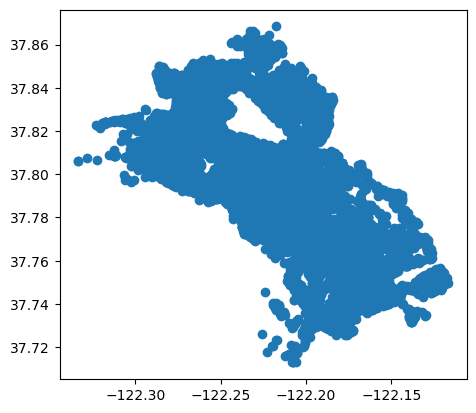

In [269]:
nodes.plot()

In [270]:
# traffic edges
edges.head(1)

,,,osmid,oneway,lanes,ref,highway,maxspeed,reversed,length,geometry,bridge,name,tunnel,access,junction
u,v,key,,,,,,,,,,,,,,
30362888,1943438853,0,710721717,True,7,I 80,motorway,50 mph,False,135.576,"LINESTRING (-122.30305 37.82584, -122.30455 37...",NaN,NaN,NaN,NaN,NaN


<AxesSubplot:>

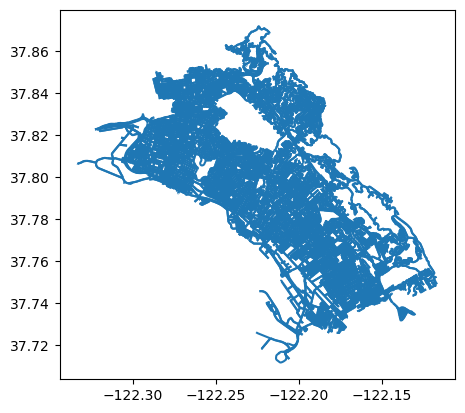

In [271]:
edges.plot()

#### 5.2.2 Roads (edges)

In [272]:
# Identify types of roads(highways)
Oak_roads = edges.copy()
print(Oak_roads['highway'].value_counts())
print("Num of rows: " + str(Oak_roads.shape[0]))
print("Num of rows: " + str(Oak_roads.shape[1]))

residential                        14961
secondary                           2926
tertiary                            2524
primary                              764
motorway_link                        319
unclassified                         217
motorway                             204
living_street                        120
secondary_link                       108
trunk                                 57
tertiary_link                         43
trunk_link                            38
primary_link                          15
[unclassified, residential]            8
[residential, living_street]           2
[secondary_link, motorway_link]        2
[secondary, residential]               1
Name: highway, dtype: int64
Num of rows: 22309
Num of rows: 14


In [273]:
# Clean roads

# remove '_link'
Oak_roads['highway'] = Oak_roads['highway'].str.replace('_link','')

# convert 'trunk' to 'secondary'
Oak_roads['highway'] = np.where(Oak_roads['highway']=='trunk', 'secondary', Oak_roads['highway'])

# convert 'living_street' to 'residential'
Oak_roads['highway'] = np.where(Oak_roads['highway']=='living_street', 'residential', Oak_roads['highway'])

In [274]:
print(Oak_roads['highway'].value_counts())

residential     15081
secondary        3129
tertiary         2567
primary           779
motorway          523
unclassified      217
Name: highway, dtype: int64


<AxesSubplot:xlabel='highway', ylabel='count'>

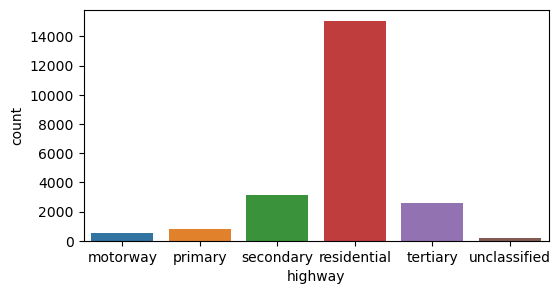

In [275]:
# countplot
fig, ax = plt.subplots(figsize=(6, 3))
sns.countplot(Oak_roads['highway'])

#### 5.2.3 Mapping of roads

In [276]:
oakland_mortorway = Oak_roads[Oak_roads.highway == 'motorway']
oakland_primary = Oak_roads[Oak_roads.highway == 'primary']
oakland_secondary = Oak_roads[Oak_roads.highway == 'secondary']
oakland_tertiary = Oak_roads[Oak_roads.highway == 'tertiary']
oakland_resid = Oak_roads[Oak_roads.highway == 'residential']

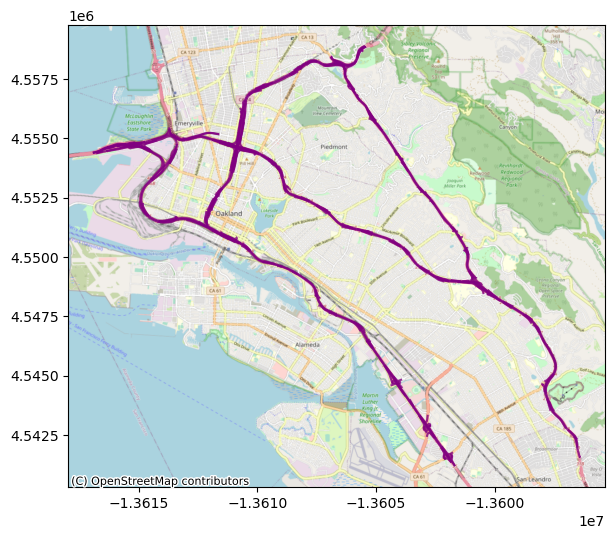

In [277]:
# Mortorway
fig, ax =  plt.subplots(figsize=(8, 6))
oakland_mortorway.to_crs(epsg=3857).plot(ax=ax, markersize=35, color='purple', edgecolor='white', alpha=0.8)

ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

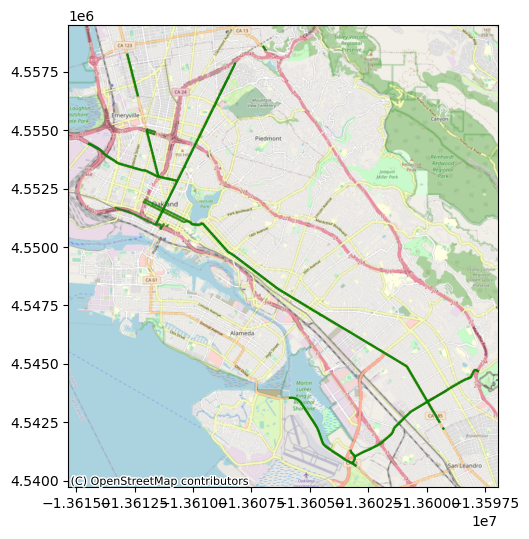

In [278]:
# Primary roads
fig, ax =  plt.subplots(figsize=(8, 6))
oakland_primary.to_crs(epsg=3857).plot(ax=ax, markersize=35, color='green', edgecolor='white', alpha=0.8)

ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

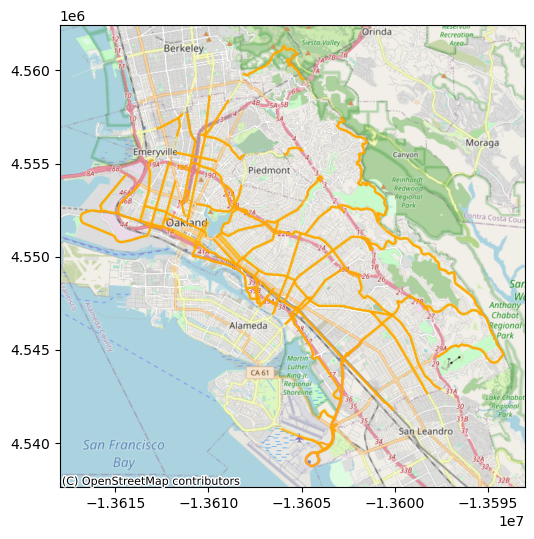

In [279]:
# Secondary roads
fig, ax =  plt.subplots(figsize=(8, 6))
oakland_secondary.to_crs(epsg=3857).plot(ax=ax, markersize=35, color='orange', edgecolor='white', alpha=0.8)

ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

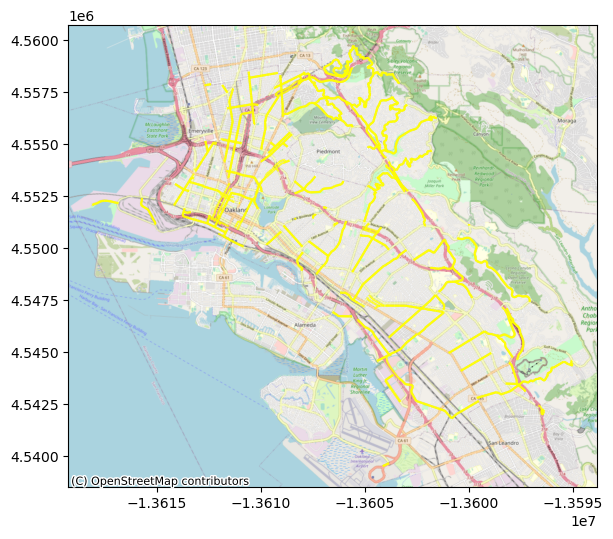

In [280]:
# Tertiary roads
fig, ax =  plt.subplots(figsize=(8, 6))
oakland_tertiary.to_crs(epsg=3857).plot(ax=ax, markersize=35, color='yellow', edgecolor='white', alpha=0.8)

ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

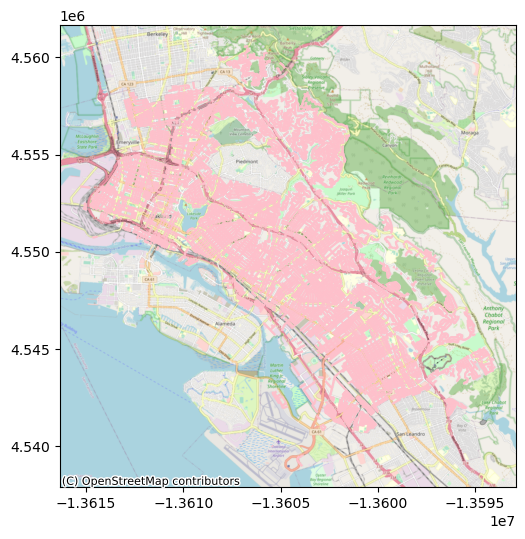

In [281]:
# Residential roads
fig, ax =  plt.subplots(figsize=(8, 6))
oakland_resid.to_crs(epsg=3857).plot(ax=ax, markersize=35, color='pink', edgecolor='white', alpha=0.8)

ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

#### 5.2.4 Road distance

In [282]:
# Convert geometry coordinate from {epsg:4362} to {epsg:32610}
# {epsg:4362} : unit in degree
# {epsg:32610}: unit in meter
gpd_city_meter = gpd_city.to_crs({'init': 'epsg:32610'})
mortorway_meter = oakland_mortorway.to_crs({'init': 'epsg:32610'})
primary_meter = oakland_primary.to_crs({'init': 'epsg:32610'})
secondary_meter = oakland_secondary.to_crs({'init': 'epsg:32610'})
tertiary_meter = oakland_tertiary.to_crs({'init': 'epsg:32610'})
resid_meter = oakland_resid.to_crs({'init': 'epsg:32610'})

In [283]:
# UDF: Calculate distance
def distance_to_road(gps, roads):
    '''Calculate the distance from the GPS points to nearest road'''
    dists = []
    for i in roads.geometry:
        dists.append(i.distance(gps))
    return (np.min(dists))

In [284]:
# Closets mortorway
tqdm.pandas()
gpd_city['closest_mortorway'] = gpd_city_meter['geometry'].progress_apply(distance_to_road, roads=mortorway_meter)

100%|████████████████████████████████████| 18235/18235 [00:22<00:00, 828.30it/s]


In [285]:
# Closets primary road
tqdm.pandas()
gpd_city['closest_primary'] = gpd_city_meter['geometry'].progress_apply(distance_to_road, roads=primary_meter)

100%|████████████████████████████████████| 18235/18235 [00:28<00:00, 633.12it/s]


In [286]:
# Closets secondary road
tqdm.pandas()
gpd_city['closest_secondary'] = gpd_city_meter['geometry'].progress_apply(distance_to_road, roads=secondary_meter)

100%|████████████████████████████████████| 18235/18235 [01:57<00:00, 154.59it/s]


In [287]:
# Closets tertiary road
tqdm.pandas()
gpd_city['closest_tertiary'] = gpd_city_meter['geometry'].progress_apply(distance_to_road, roads=tertiary_meter)

100%|████████████████████████████████████| 18235/18235 [01:36<00:00, 189.88it/s]


In [288]:
# Closets residential road
# tqdm.pandas()
# gpd_city['closest_resid'] = gpd_city_meter['geometry'].progress_apply(distance_to_road, roads=resid_meter)

### 5.3 City Structure: Intersections, traffic signal, stop sign

#### 5.3.1 Intersection

In [289]:
# Identify types of intersections
Oak_inter = nodes.copy()
print(Oak_inter['highway'].value_counts())
print("Num of rows: " + str(Oak_inter.shape[0]))
print("Num of rows: " + str(Oak_inter.shape[1]))

traffic_signals      753
turning_circle       318
stop                 317
motorway_junction    131
crossing               8
mini_roundabout        4
trailhead              3
Name: highway, dtype: int64
Num of rows: 8467
Num of rows: 6


In [290]:
Oak_inter.head(2)

,y,x,ref,highway,street_count,geometry
osmid,,,,,,
30362888,37.825844,-122.303049,8A,motorway_junction,3,POINT (-122.30305 37.82584)
30363957,37.825477,-122.307034,NaN,NaN,3,POINT (-122.30703 37.82548)


In [291]:
Oak_inter.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

#### 5.3.2 Mapping of intersections

In [292]:
oakland_traffic_signals = Oak_inter[Oak_inter.highway == 'traffic_signals']
oakland_stops = Oak_inter[Oak_inter.highway == 'stop']

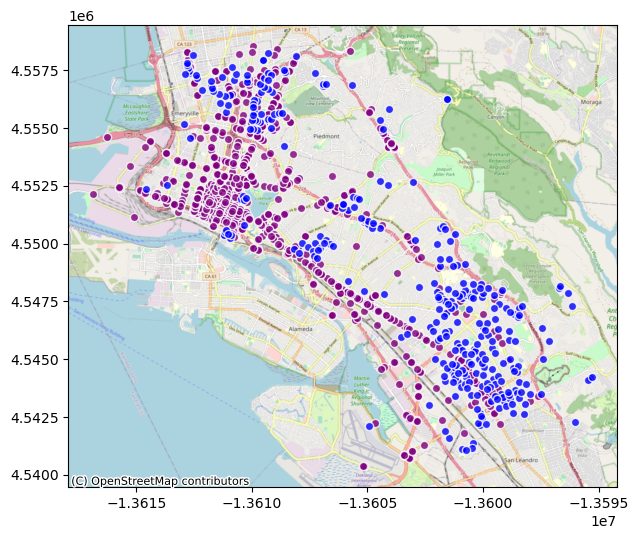

In [293]:
# Traffic_signals
fig, ax =  plt.subplots(figsize=(8, 6))
oakland_traffic_signals.to_crs(epsg=3857).plot(ax=ax, markersize=35, color='purple', edgecolor='white', alpha=0.8)
oakland_stops.to_crs(epsg=3857).plot(ax=ax, markersize=35, color='blue', edgecolor='white', alpha=0.8)
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

#### 5.3.3 Intersection distance

In [294]:
# Convert geometry coordinate from {epsg:4362} to {epsg:32610}
# {epsg:4362} : unit in degree
# {epsg:32610}: unit in meter

traffic_signals_meter = oakland_traffic_signals.to_crs({'init': 'epsg:32610'})
stops_meter = oakland_stops.to_crs({'init': 'epsg:32610'})

In [295]:
# UDF: Calculate distance
def distance_to_intersection(gps, intersections):
    '''Calculate the distance from the GPS points to nearest intersections'''
    closest_point = nearest_points(gps,MultiPoint(intersections.values))[1]
    return (gps.distance(closest_point))

In [296]:
# Closets mortorway
tqdm.pandas()
gpd_city['closest_traffic_signals'] = gpd_city_meter['geometry'].progress_apply(distance_to_intersection, intersections=traffic_signals_meter['geometry'])


100%|████████████████████████████████████| 18235/18235 [00:24<00:00, 755.52it/s]


In [297]:
# Closets mortorway
tqdm.pandas()
gpd_city['closest_stops'] = gpd_city_meter['geometry'].progress_apply(distance_to_intersection, intersections=stops_meter['geometry'])


100%|███████████████████████████████████| 18235/18235 [00:10<00:00, 1769.63it/s]


### 5.4 Categorical Data Encoding
road_type, zone, Respiratory_HI, Pt_CANCR

In [298]:
gpd_city.head(2)

,NO,NO2,PM2p5,geometry,road_type,zone,pop_den,wind,temp,Longitude,Latitude,Respiratory_HI,Pt_CANCR,closest_mortorway,closest_primary,closest_secondary,closest_tertiary,closest_traffic_signals,closest_stops
0,23.390071,17.539762,17.612700,POINT (-122.32259 37.80678),tertiary,industrial,8.336845,4.133333,14.950001,-122.322594,37.806781,high,0.7 - 0.8,1529.354679,2576.575272,3.000134e+01,0.003395,30.001344,1818.142667
1,19.700000,19.956750,15.946719,POINT (-122.32231 37.80615),secondary,industrial,8.336845,4.133333,14.950001,-122.322310,37.806150,high,0.7 - 0.8,1510.616902,2605.774822,5.009606e-08,63.387249,63.387249,1800.106387


In [299]:
gpd_city.crs

<Geographic 2D CRS: +init=epsg:4326 +type=crs>
Name: WGS 84
Axis Info [ellipsoidal]:
- lon[east]: Longitude (degree)
- lat[north]: Latitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

#### road_type, zone

In [300]:
# One-hot encoding:
# convert category features to numerical features (0&1), splitiing to different columns
road_type = gpd_city['road_type']
zone = gpd_city['zone']
gpd_city = pd.get_dummies(gpd_city, columns=['road_type'])
gpd_city = pd.get_dummies(gpd_city, columns=['zone'])
gpd_city.head(2)

,NO,NO2,PM2p5,geometry,pop_den,wind,temp,Longitude,Latitude,Respiratory_HI,...,road_type_primary,road_type_residential,road_type_secondary,road_type_tertiary,road_type_unclassified,zone_commercial,zone_industrial,zone_mixed,zone_open_space,zone_residential
0,23.390071,17.539762,17.612700,POINT (-122.32259 37.80678),8.336845,4.133333,14.950001,-122.322594,37.806781,high,...,0,0,0,1,0,0,1,0,0,0
1,19.700000,19.956750,15.946719,POINT (-122.32231 37.80615),8.336845,4.133333,14.950001,-122.322310,37.806150,high,...,0,0,1,0,0,0,1,0,0,0


In [301]:
gpd_city = pd.concat([gpd_city, zone], axis=1)
gpd_city = pd.concat([gpd_city, road_type], axis=1)

Respiratory_HI, Pt_CANCR

In [302]:
# Drop Pt_CANCR
gpd_city = gpd_city.drop(['Pt_CANCR'], axis=1)

In [303]:
# Convert Respiratory_HI to number
gpd_city['Respiratory_HI'] = np.where(gpd_city['Respiratory_HI'].str.contains('high'), '3', gpd_city['Respiratory_HI'])
gpd_city['Respiratory_HI'] = np.where(gpd_city['Respiratory_HI'].str.contains('moderate'), '2', gpd_city['Respiratory_HI'])
gpd_city['Respiratory_HI'] = np.where(gpd_city['Respiratory_HI'].str.contains('low'), '1', gpd_city['Respiratory_HI'])
gpd_city['Respiratory_HI'] =gpd_city['Respiratory_HI'].astype(float)

In [304]:
gpd_city.head(2)

,NO,NO2,PM2p5,geometry,pop_den,wind,temp,Longitude,Latitude,Respiratory_HI,...,road_type_secondary,road_type_tertiary,road_type_unclassified,zone_commercial,zone_industrial,zone_mixed,zone_open_space,zone_residential,zone,road_type
0,23.390071,17.539762,17.612700,POINT (-122.32259 37.80678),8.336845,4.133333,14.950001,-122.322594,37.806781,3.0,...,0,1,0,0,1,0,0,0,industrial,tertiary
1,19.700000,19.956750,15.946719,POINT (-122.32231 37.80615),8.336845,4.133333,14.950001,-122.322310,37.806150,3.0,...,1,0,0,0,1,0,0,0,industrial,secondary


In [305]:
gpd_city.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 18235 entries, 0 to 18234
Data columns (total 29 columns):
 #   Column                   Non-Null Count  Dtype   
---  ------                   --------------  -----   
 0   NO                       18235 non-null  float64 
 1   NO2                      18235 non-null  float64 
 2   PM2p5                    18235 non-null  float64 
 3   geometry                 18235 non-null  geometry
 4   pop_den                  18235 non-null  float64 
 5   wind                     18235 non-null  float64 
 6   temp                     18235 non-null  float64 
 7   Longitude                18235 non-null  float64 
 8   Latitude                 18235 non-null  float64 
 9   Respiratory_HI           18235 non-null  float64 
 10  closest_mortorway        18235 non-null  float64 
 11  closest_primary          18235 non-null  float64 
 12  closest_secondary        18235 non-null  float64 
 13  closest_tertiary         18235 non-null  float64 
 14

In [306]:
gpd_city.nunique()

NO                         15976
NO2                        18178
PM2p5                      18233
geometry                   18233
pop_den                       70
wind                          46
temp                          81
Longitude                  18082
Latitude                   18209
Respiratory_HI                 3
closest_mortorway          18226
closest_primary            18231
closest_secondary          18232
closest_tertiary           18230
closest_traffic_signals    18231
closest_stops              18233
road_type_motorway             2
road_type_primary              2
road_type_residential          2
road_type_secondary            2
road_type_tertiary             2
road_type_unclassified         2
zone_commercial                2
zone_industrial                2
zone_mixed                     2
zone_open_space                2
zone_residential               2
zone                           5
road_type                      6
dtype: int64

In [307]:
# Numerical features
numerical = ['NO', 'NO2', 'PM2p5', 'pop_den', 'wind', 'temp', 'closest_mortorway', 'closest_mortorway', 'closest_secondary', 'closest_tertiary', 
             'closest_traffic_signals', 'closest_stops', 'road_type_motorway', 'road_type_primary', 'road_type_residential', 'road_type_secondary', 'road_type_tertiary', 
             'road_type_unclassified', 'zone_commercial', 'zone_industrial', 'zone_mixed', 'zone_open_space', 'zone_residential', 'Longitude', 'Latitude', 'Respiratory_HI']
categorical = ['geometry', 'zone', 'road_type']

## 6. Data Visualization

In [308]:
gpd_city_vis = gpd_city.copy()

### 6.1 Feature Correlation 

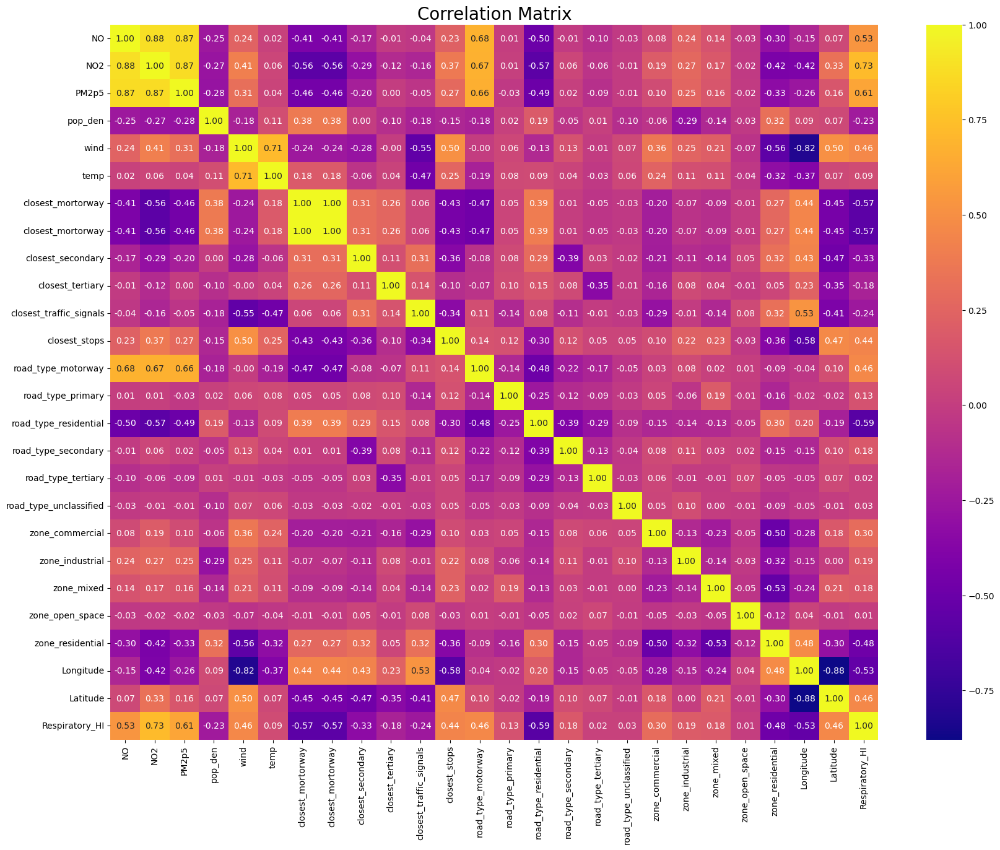

In [309]:
# Numerical features
fig, ax = plt.subplots(figsize= [20,15])
sns.heatmap(gpd_city_vis[numerical].corr(), annot=True, fmt=".2f", ax=ax, cmap = 'plasma')
ax.set_title("Correlation Matrix", fontsize=20)
plt.show()

In [310]:
# 'Respiratory_HI'
Corr = pd.DataFrame(gpd_city_vis[numerical].corr()['Respiratory_HI'].sort_values(ascending=False))
# Corr = Corr.iloc[1:,:]
Corr.columns=['Target Correlation']
Corr

,Target Correlation
Respiratory_HI,1.000000
NO2,0.728078
PM2p5,0.613488
NO,0.531084
Latitude,0.462566
road_type_motorway,0.458420
wind,0.458037
closest_stops,0.435147
zone_commercial,0.299997
zone_industrial,0.193134


<AxesSubplot:xlabel='Target Correlation'>

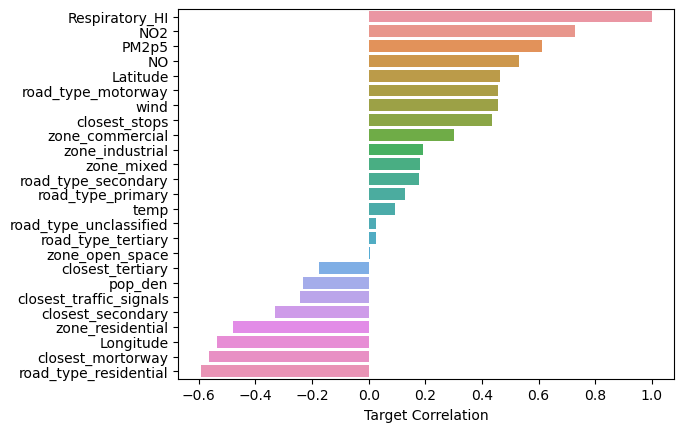

In [311]:
sns.barplot(x="Target Correlation", y=Corr.index, data=Corr)

In [312]:
# 'NO'
Corr = pd.DataFrame(gpd_city_vis[numerical].corr()['NO'].sort_values(ascending=False))
# Corr = Corr.iloc[1:,:]
Corr.columns=['Target Correlation']
Corr

,Target Correlation
NO,1.000000
NO2,0.884427
PM2p5,0.873259
road_type_motorway,0.681457
Respiratory_HI,0.531084
wind,0.241253
zone_industrial,0.240029
closest_stops,0.227445
zone_mixed,0.140667
zone_commercial,0.084717


<AxesSubplot:xlabel='Target Correlation'>

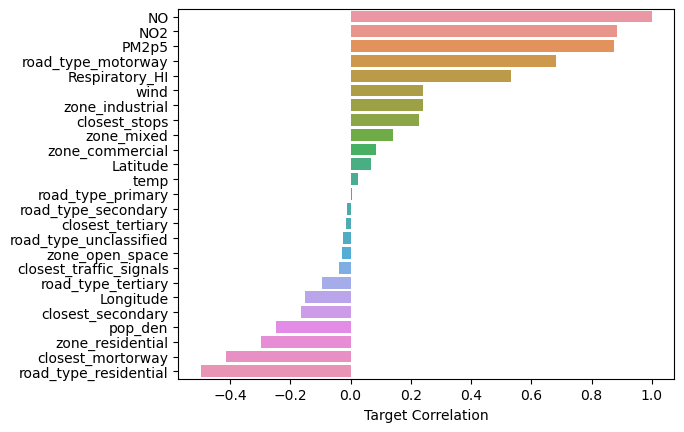

In [313]:
sns.barplot(x="Target Correlation", y=Corr.index, data=Corr)

In [314]:
# 'NO2'
Corr = pd.DataFrame(gpd_city_vis[numerical].corr()['NO2'].sort_values(ascending=False))
# Corr = Corr.iloc[1:,:]
Corr.columns=['Target Correlation']
Corr

,Target Correlation
NO2,1.000000
NO,0.884427
PM2p5,0.874705
Respiratory_HI,0.728078
road_type_motorway,0.671939
wind,0.409096
closest_stops,0.370394
Latitude,0.327358
zone_industrial,0.271873
zone_commercial,0.193806


<AxesSubplot:xlabel='Target Correlation'>

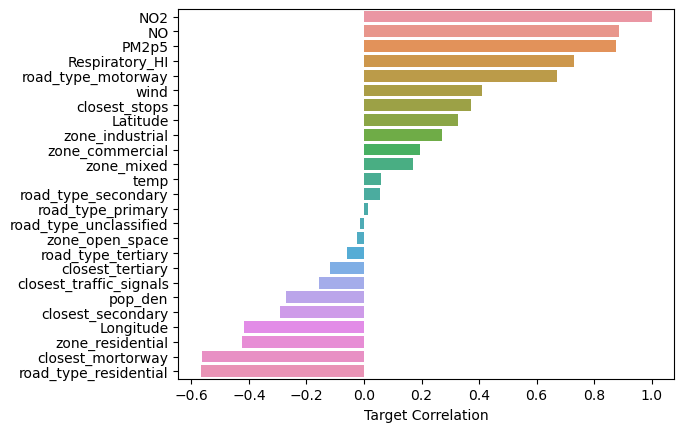

In [315]:
sns.barplot(x="Target Correlation", y=Corr.index, data=Corr)

In [316]:
# 'PM2p5'
Corr = pd.DataFrame(gpd_city_vis[numerical].corr()['PM2p5'].sort_values(ascending=False))
# Corr = Corr.iloc[1:,:]
Corr.columns=['Target Correlation']
Corr

,Target Correlation
PM2p5,1.000000
NO2,0.874705
NO,0.873259
road_type_motorway,0.664491
Respiratory_HI,0.613488
wind,0.314207
closest_stops,0.273538
zone_industrial,0.252453
Latitude,0.162531
zone_mixed,0.160005


<AxesSubplot:xlabel='Target Correlation'>

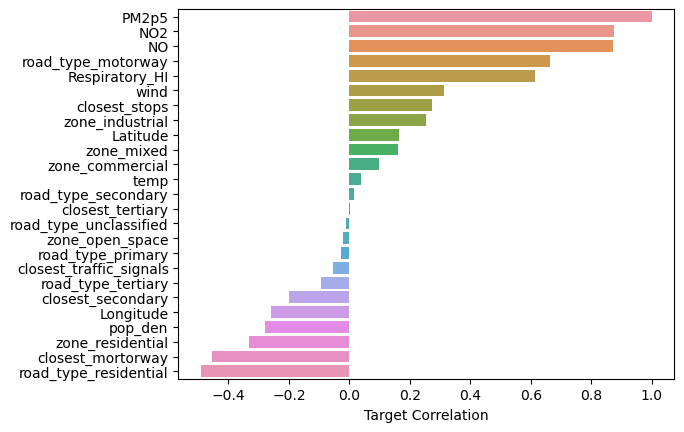

In [317]:
sns.barplot(x="Target Correlation", y=Corr.index, data=Corr)

### 6.2 Mapping
Plot the overall heatmap based on the actual map (Longitude, Latitude)

#### 6.2.1 NO

Text(0.5, 1.0, 'NO heatmap')

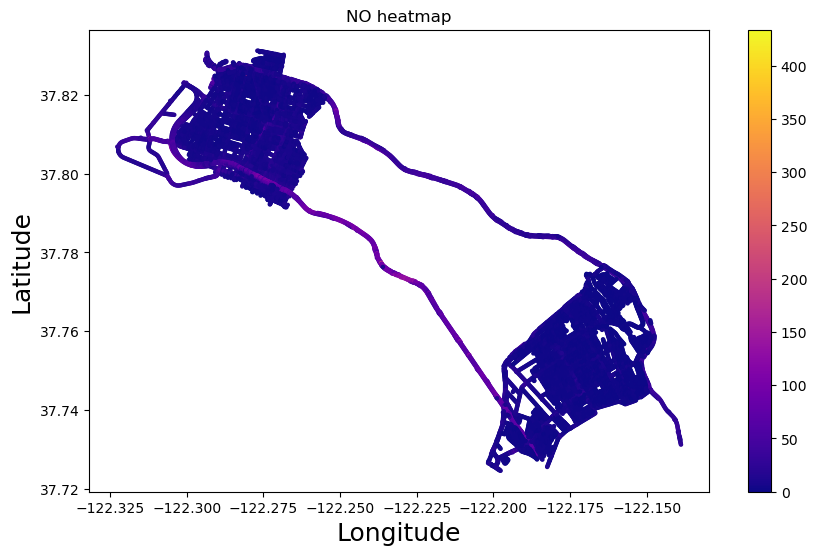

In [318]:
plt.figure(figsize = (10, 6))
plt.scatter(gpd_city_vis.Longitude, gpd_city_vis.Latitude, s=5, c = gpd_city_vis.NO, cmap = 'plasma')
plt.colorbar()
plt.xlabel('Longitude', fontsize=18) 
plt.ylabel('Latitude', fontsize=18)
plt.title('NO heatmap')

#### 6.2.2 NO2

Text(0.5, 1.0, 'NO2 heatmap')

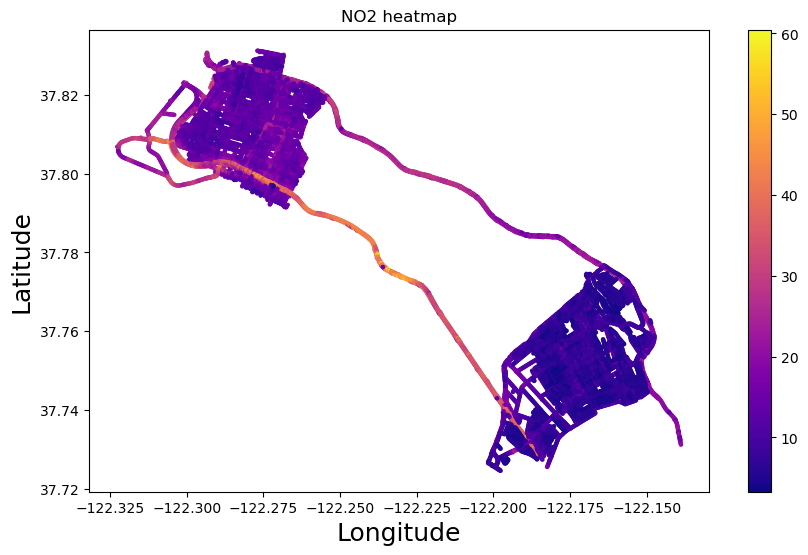

In [319]:
plt.figure(figsize = (10, 6))
plt.scatter(gpd_city_vis.Longitude, gpd_city_vis.Latitude, s=5, c = gpd_city_vis.NO2, cmap = 'plasma')
plt.colorbar()
plt.xlabel('Longitude', fontsize=18) 
plt.ylabel('Latitude', fontsize=18)
plt.title('NO2 heatmap')

#### 6.2.3 PM2p5

Text(0.5, 1.0, 'PM2p5 heatmap')

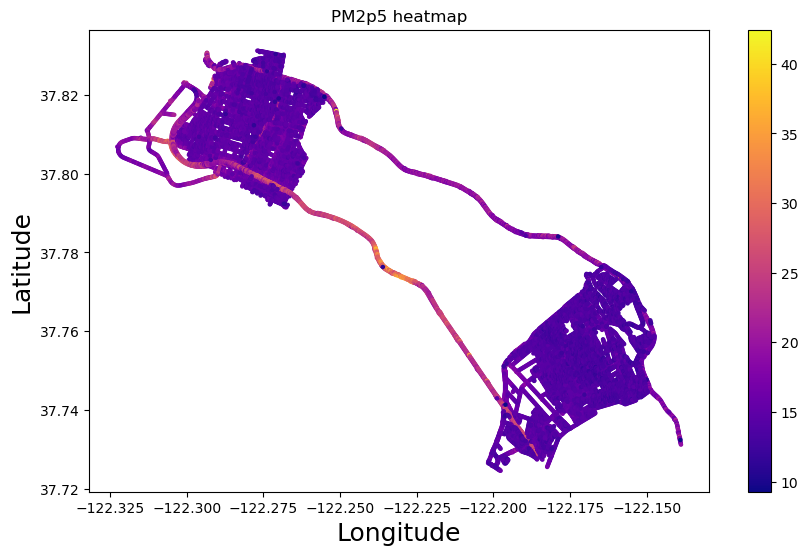

In [320]:
plt.figure(figsize = (10, 6))
plt.scatter(gpd_city_vis.Longitude, gpd_city_vis.Latitude, s=5, c = gpd_city_vis.PM2p5, cmap = 'plasma')
plt.colorbar()
plt.xlabel('Longitude', fontsize=18) 
plt.ylabel('Latitude', fontsize=18)
plt.title('PM2p5 heatmap')

### 6.3 Categorical features

#### 6.3.1 Road

<AxesSubplot:xlabel='road_type', ylabel='count'>

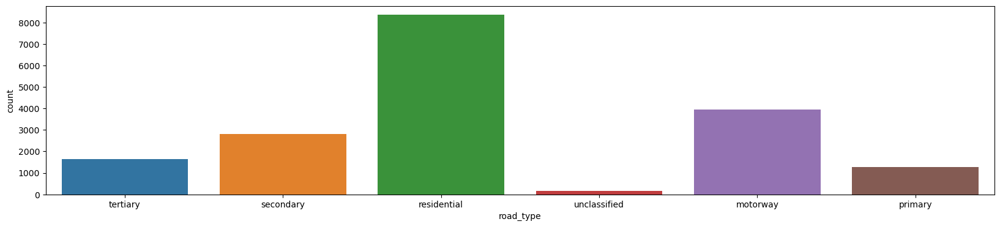

In [321]:
plt.figure(figsize = (20,4))
sns.countplot(x='road_type', data=gpd_city_vis)

<AxesSubplot:xlabel='road_type', ylabel='count'>

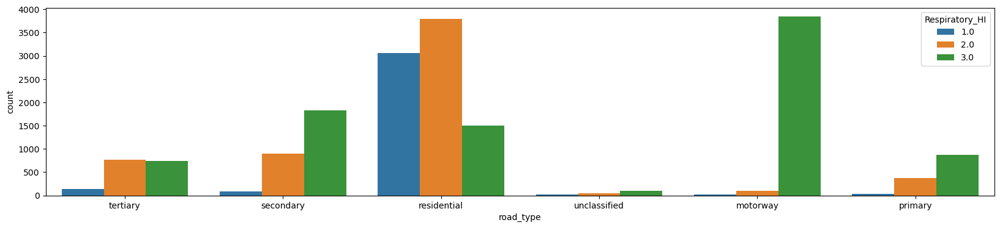

In [322]:
# Road type and health
plt.figure(figsize = (20,4))
sns.countplot(x='road_type', hue=gpd_city_vis['Respiratory_HI'], data=gpd_city_vis)

<AxesSubplot:xlabel='road_type', ylabel='NO'>

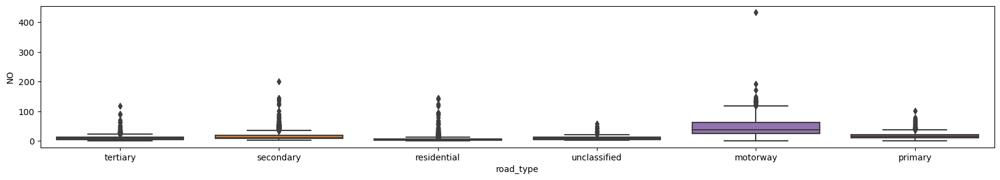

In [323]:
# Road type and NO
plt.figure(figsize = (20,3))
sns.boxplot(x=gpd_city_vis['road_type'], y=gpd_city_vis['NO'])

<AxesSubplot:xlabel='road_type', ylabel='NO2'>

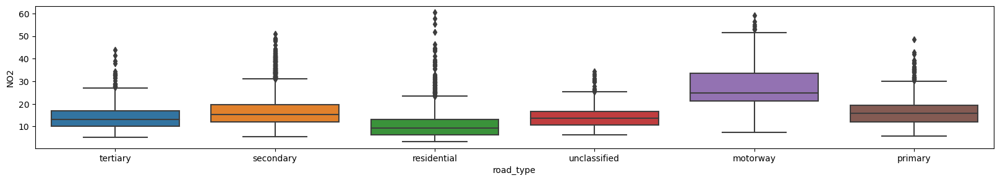

In [324]:
# Road type and NO2
plt.figure(figsize = (20,3))
sns.boxplot(x=gpd_city_vis['road_type'], y=gpd_city_vis['NO2'])

<AxesSubplot:xlabel='road_type', ylabel='PM2p5'>

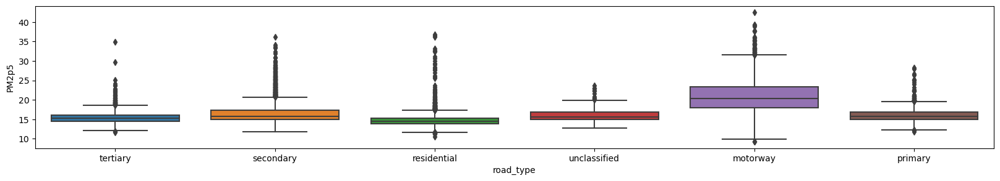

In [325]:
# Road type and PM2p5
plt.figure(figsize = (20,3))
sns.boxplot(x=gpd_city_vis['road_type'], y=gpd_city_vis['PM2p5'])

#### 6.3.2 Zone

<AxesSubplot:xlabel='zone', ylabel='count'>

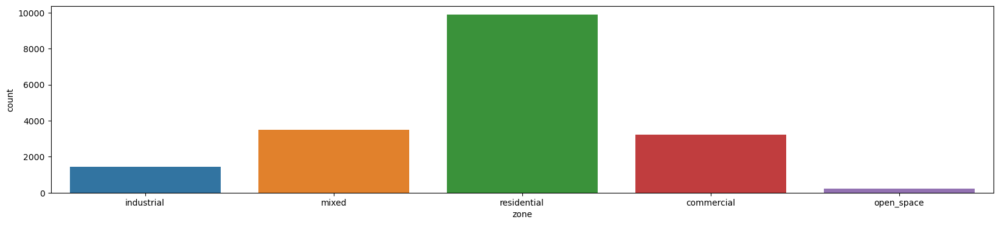

In [326]:
plt.figure(figsize = (20,4))
sns.countplot(x='zone', data=gpd_city_vis)

<AxesSubplot:xlabel='zone', ylabel='count'>

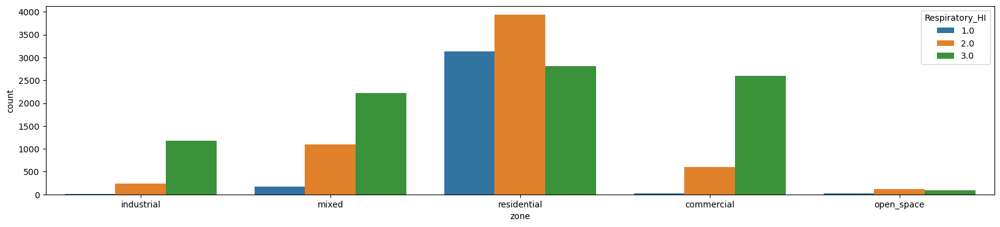

In [327]:
# Zone type and health
plt.figure(figsize = (20,4))
sns.countplot(x='zone', hue=gpd_city_vis['Respiratory_HI'], data=gpd_city_vis)

<AxesSubplot:xlabel='zone', ylabel='NO'>

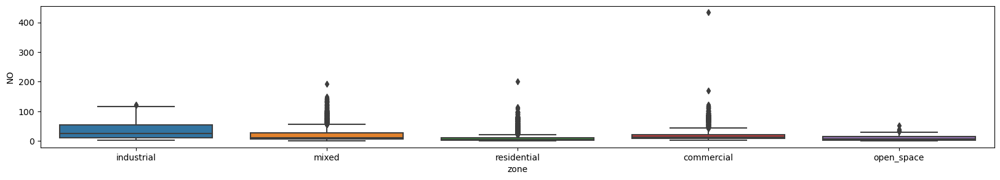

In [328]:
# Zone type and NO
plt.figure(figsize = (20,3))
sns.boxplot(x=gpd_city_vis['zone'], y=gpd_city_vis['NO'])

<AxesSubplot:xlabel='zone', ylabel='NO2'>

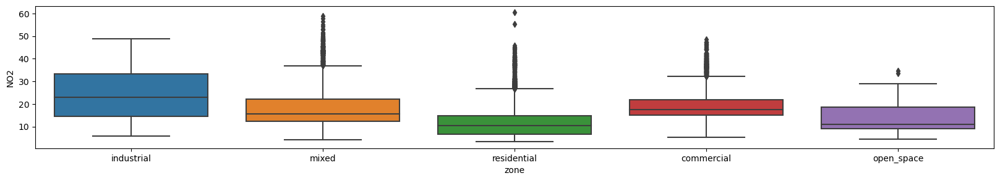

In [329]:
# Zone type and NO2
plt.figure(figsize = (20,3))
sns.boxplot(x=gpd_city_vis['zone'], y=gpd_city_vis['NO2'])

<AxesSubplot:xlabel='zone', ylabel='PM2p5'>

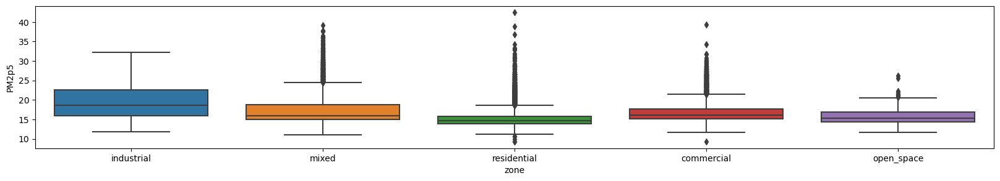

In [330]:
# Zone type and PM2p5
plt.figure(figsize = (20,3))
sns.boxplot(x=gpd_city_vis['zone'], y=gpd_city_vis['PM2p5'])

#### 6.3.3 Location(zone, road) & Air pollution & Health

<AxesSubplot:xlabel='zone', ylabel='NO'>

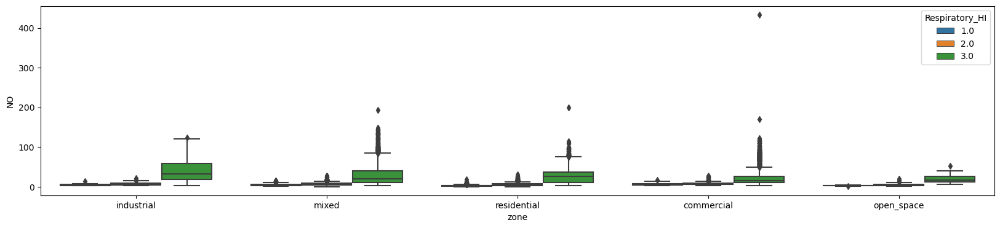

In [331]:
plt.figure(figsize=(20,4))
sns.boxplot(x=gpd_city_vis['zone'], hue=gpd_city_vis['Respiratory_HI'], y=gpd_city_vis['NO'])

<AxesSubplot:xlabel='zone', ylabel='NO2'>

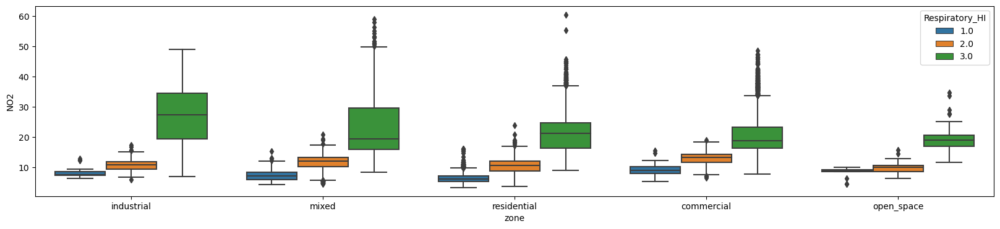

In [332]:
plt.figure(figsize=(20,4))
sns.boxplot(x=gpd_city_vis['zone'], hue=gpd_city_vis['Respiratory_HI'], y=gpd_city_vis['NO2'])

<AxesSubplot:xlabel='zone', ylabel='PM2p5'>

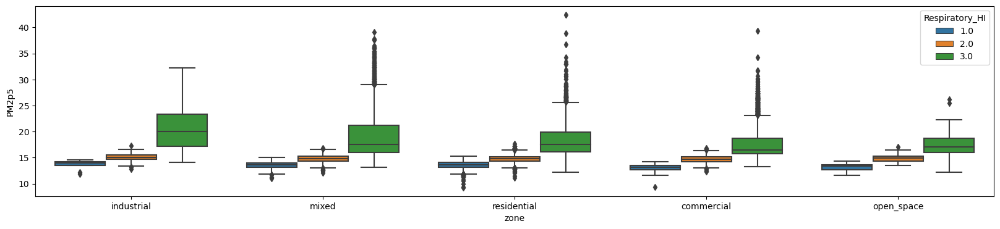

In [333]:
plt.figure(figsize=(20,4))
sns.boxplot(x=gpd_city_vis['zone'], hue=gpd_city_vis['Respiratory_HI'], y=gpd_city_vis['PM2p5'])

<AxesSubplot:xlabel='road_type', ylabel='NO'>

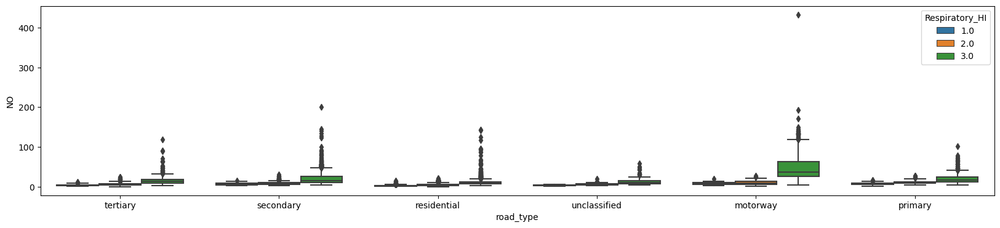

In [334]:
plt.figure(figsize=(20,4))
sns.boxplot(x=gpd_city_vis['road_type'], hue=gpd_city_vis['Respiratory_HI'], y=gpd_city_vis['NO'])

<AxesSubplot:xlabel='road_type', ylabel='NO2'>

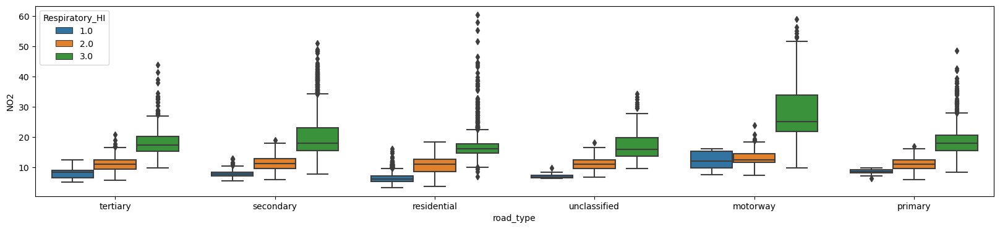

In [335]:
plt.figure(figsize=(20,4))
sns.boxplot(x=gpd_city_vis['road_type'], hue=gpd_city_vis['Respiratory_HI'], y=gpd_city_vis['NO2'])

<AxesSubplot:xlabel='road_type', ylabel='PM2p5'>

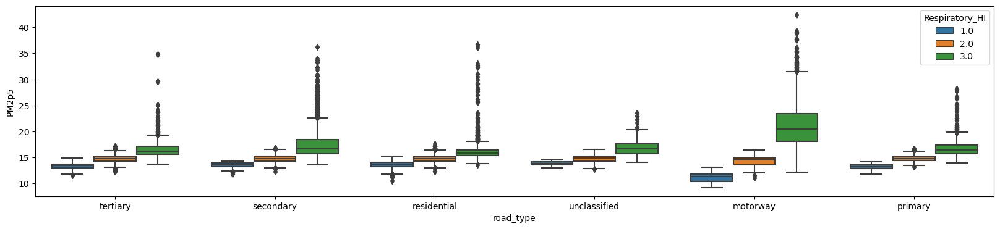

In [336]:
plt.figure(figsize=(20,4))
sns.boxplot(x=gpd_city_vis['road_type'], hue=gpd_city_vis['Respiratory_HI'], y=gpd_city_vis['PM2p5'])

#### 6.3.4 Air pollution trend with distance

Text(0, 0.5, 'NO')

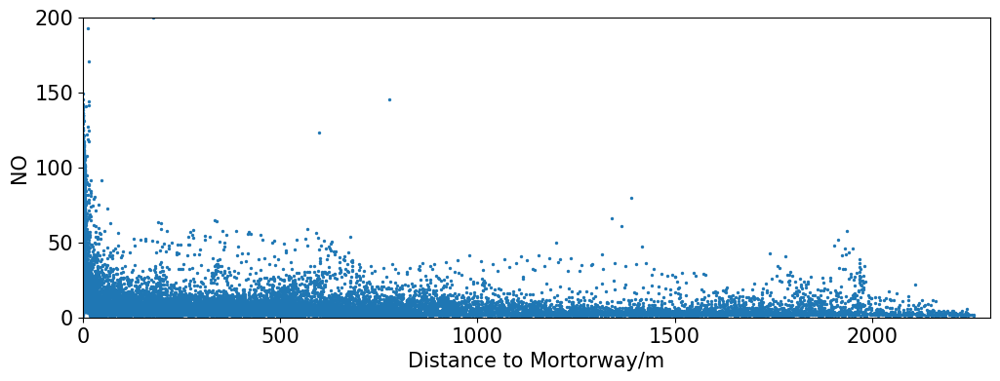

In [337]:
# NO
plt.figure(figsize=(12,4))
plt.scatter(gpd_city_vis['closest_mortorway'], gpd_city_vis['NO'], s=2)
plt.ylim(0,200)
plt.xlim(0,2300)
plt.tick_params(labelsize=15)
plt.xlabel('Distance to Mortorway/m', fontsize=15)
plt.ylabel('NO',fontsize=15)

Text(0, 0.5, 'NO2')

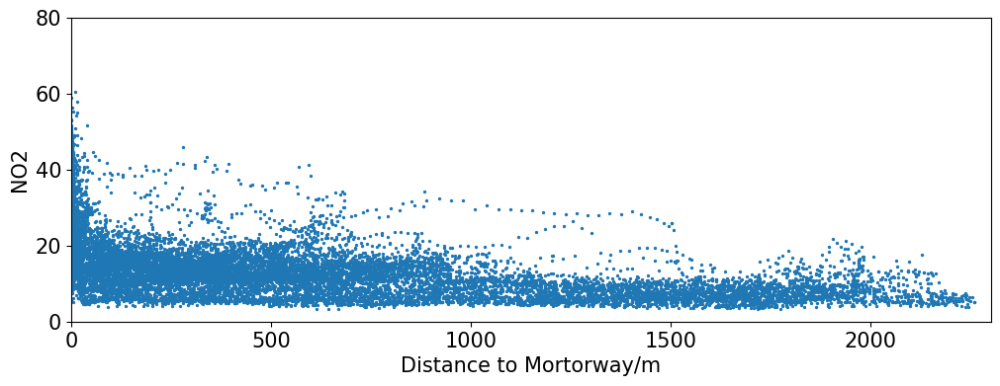

In [338]:
# NO2
plt.figure(figsize=(12,4))
plt.scatter(gpd_city_vis['closest_mortorway'], gpd_city_vis['NO2'], s=2)
plt.ylim(0,80)
plt.xlim(0,2300)
plt.tick_params(labelsize=15)
plt.xlabel('Distance to Mortorway/m', fontsize=15)
plt.ylabel('NO2',fontsize=15)

Text(0, 0.5, 'PM2p5/ ug/m3')

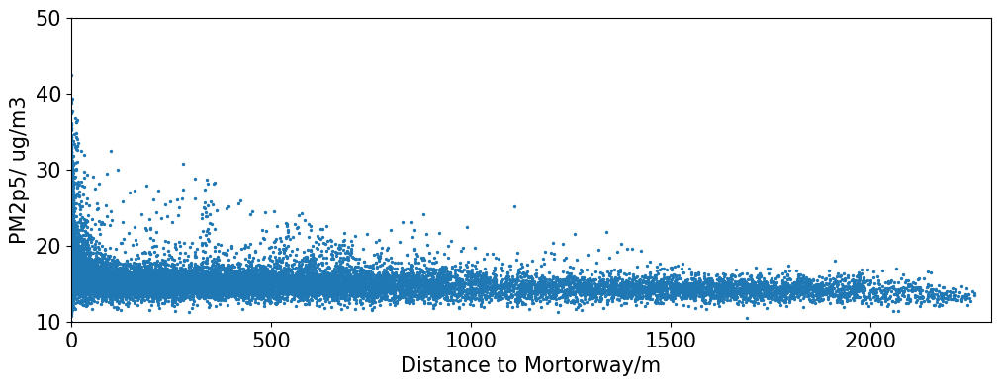

In [339]:
# PM2p5
plt.figure(figsize=(12,4))
plt.scatter(gpd_city_vis['closest_mortorway'], gpd_city_vis['PM2p5'], s=2)
plt.ylim(10,50)
plt.xlim(0,2300)
plt.tick_params(labelsize=15)
plt.xlabel('Distance to Mortorway/m', fontsize=15)
plt.ylabel('PM2p5/ ug/m3',fontsize=15)

## 7. Model

In [398]:
def abline(slope, intercept):
    """Plot a line from slope and intercept"""
    axes = plt.gca()
    x_vals = np.array(axes.get_xlim())
    y_vals = intercept + slope * x_vals
    plt.plot(x_vals, y_vals, '-', color='black')

    
def pred_summary(pred, ytest, limit = 200):
    """Plotting for test set predictions"""
    sns.scatterplot(pred, ytest)
    abline(1, 0) #1-1 line
    plt.ylim(0, limit); plt.xlim(0, limit)
    plt.tick_params(labelsize=18)
    
    print('RMSE', np.sqrt(mean_squared_error(ytest, pred)))
    print('R2', r2_score(ytest, pred))

### 7.1 Feature selection

In [399]:
gpd_city[numerical].columns

Index(['NO', 'NO2', 'PM2p5', 'pop_den', 'wind', 'temp', 'closest_mortorway',
       'closest_mortorway', 'closest_secondary', 'closest_tertiary',
       'closest_traffic_signals', 'closest_stops', 'road_type_motorway',
       'road_type_primary', 'road_type_residential', 'road_type_secondary',
       'road_type_tertiary', 'road_type_unclassified', 'zone_commercial',
       'zone_industrial', 'zone_mixed', 'zone_open_space', 'zone_residential',
       'Longitude', 'Latitude', 'Respiratory_HI'],
      dtype='object')

In [400]:
X = gpd_city[numerical].drop(['NO', 'NO2', 'PM2p5','Longitude', 'Latitude', 'Respiratory_HI','road_type_unclassified'], axis=1)
X.columns

Index(['pop_den', 'wind', 'temp', 'closest_mortorway', 'closest_mortorway',
       'closest_secondary', 'closest_tertiary', 'closest_traffic_signals',
       'closest_stops', 'road_type_motorway', 'road_type_primary',
       'road_type_residential', 'road_type_secondary', 'road_type_tertiary',
       'zone_commercial', 'zone_industrial', 'zone_mixed', 'zone_open_space',
       'zone_residential'],
      dtype='object')

In [401]:
X.head()

,pop_den,wind,temp,closest_mortorway,closest_mortorway,closest_secondary,closest_tertiary,closest_traffic_signals,closest_stops,road_type_motorway,road_type_primary,road_type_residential,road_type_secondary,road_type_tertiary,zone_commercial,zone_industrial,zone_mixed,zone_open_space,zone_residential
0,8.336845,4.133333,14.950001,1529.354679,1529.354679,3.000134e+01,0.003395,30.001344,1818.142667,0,0,0,0,1,0,1,0,0,0
1,8.336845,4.133333,14.950001,1510.616902,1510.616902,5.009606e-08,63.387249,63.387249,1800.106387,0,0,0,1,0,0,1,0,0,0
2,8.336845,4.133333,14.950001,1506.806733,1506.806733,2.889834e-01,33.436991,33.436991,1796.026464,0,0,0,1,0,0,1,0,0,0
3,8.336845,4.133333,14.950001,1513.209482,1513.209482,2.675342e-03,93.269052,93.269052,1802.893651,0,0,0,1,0,0,1,0,0,0
4,8.336845,4.133333,14.950001,1501.369611,1501.369611,3.989883e-02,3.463454,3.463454,1790.303496,0,0,0,1,0,0,1,0,0,0


### 7.2. Train_test_split & Feature Scaling

NO Train_test_split

In [402]:
y_NO = gpd_city['NO']

X_train_NO, X_test_NO, y_train_NO, y_test_NO = model_selection.train_test_split(X, y_NO, test_size=0.25, random_state=1)
print('NO training data has ' + str(X_train_NO.shape[0]) + ' observation with ' + str(X_train_NO.shape[1]) + ' features')
print('NO testing data has ' + str(X_test_NO.shape[0]) + ' observation with ' + str(X_test_NO.shape[1]) + ' features')

NO training data has 13676 observation with 19 features
NO testing data has 4559 observation with 19 features


In [403]:
X_train_NO

,pop_den,wind,temp,closest_mortorway,closest_mortorway,closest_secondary,closest_tertiary,closest_traffic_signals,closest_stops,road_type_motorway,road_type_primary,road_type_residential,road_type_secondary,road_type_tertiary,zone_commercial,zone_industrial,zone_mixed,zone_open_space,zone_residential
11952,3611.186034,3.966667,15.225001,1323.727988,1323.727988,411.273066,726.999091,411.307981,142.364420,0,0,1,0,0,0,0,0,0,1
17287,5963.437126,3.891666,15.141665,1091.489165,1091.489165,319.559186,164.009156,495.883389,38.247340,0,0,1,0,0,0,0,0,0,1
1601,4450.015508,4.066666,15.166668,459.384471,459.384471,297.633678,1.457452,221.596390,142.981525,0,0,0,0,1,0,0,1,0,0
9252,220.026011,4.083333,15.116668,400.232105,400.232105,239.085897,132.954888,374.429154,583.126185,0,0,1,0,0,0,0,1,0,0
10487,3971.997923,4.041667,15.191669,151.655681,151.655681,236.681970,112.602358,207.474103,1288.542916,0,0,1,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10955,5728.043969,4.000000,15.125001,64.144241,64.144241,5.418268,225.514693,5.421726,851.201367,0,0,1,0,0,0,0,0,0,1
17289,5778.406435,3.875000,15.058334,813.774157,813.774157,164.319280,304.474320,403.630102,286.790646,0,0,1,0,0,0,0,0,0,1
5192,3202.853186,4.025000,15.150001,779.065368,779.065368,332.675459,0.575344,8.427883,317.369846,0,0,0,0,1,1,0,0,0,0
12172,5204.235775,3.966667,15.225001,1896.238150,1896.238150,936.555748,321.069881,80.349684,120.566824,0,0,1,0,0,0,0,0,0,1


NO Feature Scaling

In [404]:
scaler_NO = StandardScaler()
scaler_NO.fit(X_train_NO)
X_train_NO_scale = scaler_NO.transform(X_train_NO)
X_test_NO_scale = scaler_NO.transform(X_test_NO)

In [405]:
X_train_NO_scale

array([[-0.05019666, -0.30692765,  0.82682837, ..., -0.48473166,
        -0.11385079,  0.91794881],
       [ 0.91545275, -1.14274642,  0.2516449 , ..., -0.48473166,
        -0.11385079,  0.91794881],
       [ 0.29416079,  0.80748055,  0.42421179, ...,  2.06299708,
        -0.11385079, -1.08938536],
       ...,
       [-0.21782603,  0.34314712,  0.30917376, ..., -0.48473166,
        -0.11385079, -1.08938536],
       [ 0.60378435, -0.30692765,  0.82682837, ..., -0.48473166,
        -0.11385079,  0.91794881],
       [-1.44234042,  1.27182461, -0.38101475, ..., -0.48473166,
        -0.11385079, -1.08938536]])

NO2 Train_test_split

In [406]:
y_NO2 = gpd_city['NO2']

X_train_NO2, X_test_NO2, y_train_NO2, y_test_NO2 = model_selection.train_test_split(X, y_NO2, test_size=0.25, random_state=2)
print('NO2 training data has ' + str(X_train_NO2.shape[0]) + ' observation with ' + str(X_train_NO2.shape[1]) + ' features')
print('NO2 testing data has ' + str(X_test_NO2.shape[0]) + ' observation with ' + str(X_test_NO2.shape[1]) + ' features')

NO2 training data has 13676 observation with 19 features
NO2 testing data has 4559 observation with 19 features


NO2 Feature Scaling

In [407]:
scaler_NO2 = StandardScaler()
scaler_NO2.fit(X_train_NO2)
X_train_NO2_scale = scaler_NO2.transform(X_train_NO2)
X_test_NO2_scale = scaler_NO2.transform(X_test_NO2)

In [408]:
X_train_NO2_scale

array([[-1.50552742,  1.1690276 ,  0.87524402, ..., -0.48611158,
        -0.10601546, -1.08362578],
       [-0.17446348, -1.44349069, -1.99999373, ..., -0.48611158,
        -0.10601546,  0.9228278 ],
       [-0.17446348, -1.91001267, -3.26509411, ..., -0.48611158,
        -0.10601546,  0.9228278 ],
       ...,
       [-0.04564766, -0.3238358 ,  0.81775328, ...,  2.05714088,
        -0.10601546, -1.08362578],
       [ 1.03812068, -0.51044672, -0.38986291, ..., -0.48611158,
        -0.10601546,  0.9228278 ],
       [-1.4556705 ,  0.51589736,  0.58773738, ..., -0.48611158,
        -0.10601546, -1.08362578]])

In [409]:
X_train_NO2

,pop_den,wind,temp,closest_mortorway,closest_mortorway,closest_secondary,closest_tertiary,closest_traffic_signals,closest_stops,road_type_motorway,road_type_primary,road_type_residential,road_type_secondary,road_type_tertiary,zone_commercial,zone_industrial,zone_mixed,zone_open_space,zone_residential
3389,68.291380,4.100000,15.233333,112.424463,112.424463,252.712487,84.944700,137.093953,1062.045472,0,0,1,0,0,1,0,0,0,0
16767,3298.570658,3.866667,14.816667,980.425863,980.425863,129.377059,547.715959,305.379845,126.076018,0,0,1,0,0,0,0,0,0,1
8423,3298.570658,3.825000,14.633334,0.007262,0.007262,416.074932,276.207073,446.711757,73.771729,1,0,0,0,0,0,0,0,0,1
11241,3912.117390,4.033333,15.350001,983.713493,983.713493,148.154518,866.983760,277.318076,429.535364,0,0,1,0,0,0,1,0,0,0
8390,724.106347,3.825000,14.633334,0.032594,0.032594,643.552261,207.366588,733.126096,99.684764,1,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14696,6241.318446,3.991667,15.091667,327.141914,327.141914,529.240197,235.294809,109.270811,843.425179,0,0,1,0,0,0,0,1,0,0
1099,3335.779074,4.058333,15.166668,530.659803,530.659803,0.000177,44.210359,119.119417,769.077486,0,0,0,1,0,0,0,1,0,0
11798,3611.186034,3.966667,15.225001,1162.124295,1162.124295,322.519829,855.257659,364.242508,233.636559,0,0,1,0,0,0,0,1,0,0
6637,6241.318446,3.950000,15.049999,0.177778,0.177778,224.564691,129.059938,238.541227,583.123415,0,0,1,0,0,0,0,0,0,1


PM2p5 Train_test_split

In [410]:
y_PM2p5 = gpd_city['PM2p5']

X_train_PM2p5, X_test_PM2p5, y_train_PM2p5, y_test_PM2p5 = model_selection.train_test_split(X, y_PM2p5, test_size=0.25, random_state=3)
print('PM2p5 training data has ' + str(X_train_PM2p5.shape[0]) + ' observation with ' + str(X_train_PM2p5.shape[1]) + ' features')
print('PM2p5 testing data has ' + str(X_test_PM2p5.shape[0]) + ' observation with ' + str(X_test_PM2p5.shape[1]) + ' features')

PM2p5 training data has 13676 observation with 19 features
PM2p5 testing data has 4559 observation with 19 features


PM2p5 Feature Scaling

In [411]:
scaler_PM2p5 = StandardScaler()
scaler_PM2p5.fit(X_train_PM2p5)
X_train_PM2p5_scale = scaler_PM2p5.transform(X_train_PM2p5)
X_test_PM2p5_scale = scaler_PM2p5.transform(X_test_PM2p5)

### 7.3 NO Modelling

#### 7.3.1 Model selection with Cross Validation (no hyperparameter)

In [412]:
regressors = [
    LinearRegression(),
    DecisionTreeRegressor(),
    RandomForestRegressor(),
    GradientBoostingRegressor(),
    KNeighborsRegressor()]

In [413]:
# cross_val_score: evaluate a score by cv
for regressor in regressors:
    %time
    cv_score = cross_val_score(regressor, X_train_NO_scale, y_train_NO, cv=5)
    print(cv_score)
    print('Model accuracy of ', regressor, ' is ' + str(cv_score.mean()))
    print('========')

CPU times: user 5 µs, sys: 4 µs, total: 9 µs
Wall time: 17.2 µs
[0.58700974 0.60204864 0.58892551 0.57853937 0.58185817]
Model accuracy of  LinearRegression()  is 0.5876762863179501
CPU times: user 7 µs, sys: 16 µs, total: 23 µs
Wall time: 6.2 µs
[0.82399776 0.83147695 0.82112851 0.85792582 0.82351157]
Model accuracy of  DecisionTreeRegressor()  is 0.8316081220135857
CPU times: user 1e+03 ns, sys: 1e+03 ns, total: 2 µs
Wall time: 4.29 µs
[0.88264928 0.91383977 0.90083072 0.91798053 0.88994716]
Model accuracy of  RandomForestRegressor()  is 0.9010494908755682
CPU times: user 2 µs, sys: 1e+03 ns, total: 3 µs
Wall time: 3.81 µs
[0.79787989 0.82323382 0.81061415 0.822111   0.80794552]
Model accuracy of  GradientBoostingRegressor()  is 0.812356876522179
CPU times: user 1e+03 ns, sys: 1e+03 ns, total: 2 µs
Wall time: 2.86 µs
[0.86030021 0.87681729 0.8506289  0.88646915 0.84415754]
Model accuracy of  KNeighborsRegressor()  is 0.8636746179187569


RandomForestRegressor is faster and more accurate

#### 7.3.2 Ensemble learning - Bagging (RandomForestRegressor)

In [414]:
# Running 2 trees simultaneously 
forest_NO = RandomForestRegressor(n_jobs=2)
params = {'max_features': [6, 8, 10],        # depth of trees 
          'n_estimators': [150, 200]}        # tree number
GRID_forest_NO = GridSearchCV(forest_NO, params, cv=5, scoring = 'neg_mean_squared_error')
GRID_forest_NO.fit(X_train_NO_scale, y_train_NO)

GridSearchCV(cv=5, estimator=RandomForestRegressor(n_jobs=2),
             param_grid={'max_features': [6, 8, 10],
                         'n_estimators': [150, 200]},
             scoring='neg_mean_squared_error')

In [415]:
#Best estimator and CV score
print('Best score (RMSE)', np.sqrt(np.abs(GRID_forest_NO.best_score_)))
print(GRID_forest_NO.best_estimator_)

Best score (RMSE) 6.464227942211766
RandomForestRegressor(max_features=10, n_estimators=150, n_jobs=2)


RMSE 8.897350100980802
R2 0.8344164200934466


Text(0, 0.5, 'Observed NO')

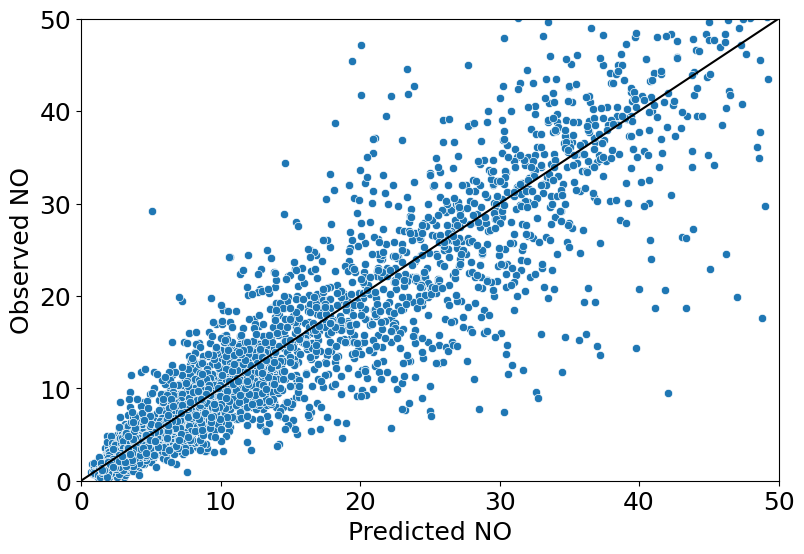

In [417]:
plt.figure(figsize=(9,6))
y_pred = GRID_forest_NO.predict(X_test_NO_scale)
pred_summary(y_pred, y_test_NO, limit=50)
plt.xlabel('Predicted NO', fontsize = 18); plt.ylabel('Observed NO', fontsize=18)

In [418]:
# Feature importance
FI_rf_NO = pd.DataFrame(GRID_forest_NO.best_estimator_.feature_importances_, index=X_train_NO.columns, columns=['Feature Importance (RF)'])
FI_rf_NO = FI_rf_NO.sort_values(by='Feature Importance (RF)',ascending=False)
FI_rf_NO

,Feature Importance (RF)
road_type_motorway,0.203413
closest_mortorway,0.165416
closest_mortorway,0.164286
temp,0.114993
wind,0.060681
pop_den,0.049377
closest_tertiary,0.044235
closest_secondary,0.043955
closest_stops,0.041021
closest_traffic_signals,0.037298


#### Permutation Importance

In [419]:
# Permutation Importance - Random Forest
GRID_forest_NO_best = GRID_forest_NO.best_estimator_
PI_NO = permutation_importance(GRID_forest_NO_best, X_test_NO_scale, y_test_NO, n_repeats=5, random_state=1)

In [420]:
PI = pd.DataFrame(data=np.transpose([PI_NO['importances_mean'], PI_NO['importances_std']]), index= X_test_NO.columns, columns=['PI_mean', 'PI_std'])
PI = PI.sort_values(by='PI_mean', ascending= False)
PI

,PI_mean,PI_std
closest_mortorway,0.209668,0.003047
closest_mortorway,0.201582,0.003288
temp,0.178693,0.012795
road_type_motorway,0.149391,0.003342
wind,0.077424,0.004428
pop_den,0.057373,0.002450
closest_secondary,0.056238,0.002509
road_type_residential,0.042624,0.001347
closest_stops,0.036757,0.006955
closest_tertiary,0.034613,0.001032


#### 7.3.3 Ensemble learning - Boosting (GradientBoostingRegressor)

In [421]:
gb_NO = GradientBoostingRegressor()
params = {'max_features': [6, 8, 10],
          'learning_rate': [0.05, 0.1, 0.5],
          'n_estimators': [150, 200]}       
GRID_gb_NO = GridSearchCV(gb_NO, params, cv=5, scoring = 'neg_mean_squared_error')
GRID_gb_NO.fit(X_train_NO_scale, y_train_NO)

GridSearchCV(cv=5, estimator=GradientBoostingRegressor(),
             param_grid={'learning_rate': [0.05, 0.1, 0.5],
                         'max_features': [6, 8, 10],
                         'n_estimators': [150, 200]},
             scoring='neg_mean_squared_error')

In [422]:
#Best estimator and CV score
print('Best score (RMSE)', np.sqrt(np.abs(GRID_gb_NO.best_score_)))
print(GRID_gb_NO.best_estimator_)

Best score (RMSE) 8.14589953897061
GradientBoostingRegressor(learning_rate=0.5, max_features=10, n_estimators=150)


RMSE 10.475069352083356
R2 0.770485714667989


Text(0, 0.5, 'Observed NO')

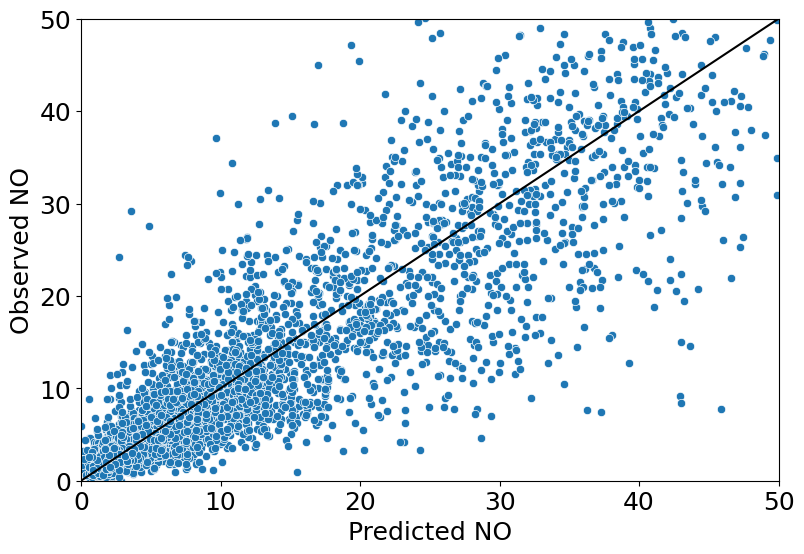

In [424]:
plt.figure(figsize=(9,6))
y_pred = GRID_gb_NO.predict(X_test_NO_scale)
pred_summary(y_pred, y_test_NO, limit=50)
plt.xlabel('Predicted NO', fontsize = 18); plt.ylabel('Observed NO', fontsize=18)

In [425]:
# Feature importance
FI_gb_NO = pd.DataFrame(GRID_gb_NO.best_estimator_.feature_importances_, index=X_train_NO.columns, columns=['Feature Importance (GB)'])
FI_gb_NO = FI_gb_NO.sort_values(by='Feature Importance (GB)',ascending=False)
FI_gb_NO

,Feature Importance (GB)
road_type_motorway,0.391473
closest_mortorway,0.137319
temp,0.120943
closest_mortorway,0.069726
wind,0.065078
pop_den,0.041769
closest_tertiary,0.039878
road_type_residential,0.032178
closest_secondary,0.031419
closest_stops,0.027952


#### Permutation Importance

In [426]:
# Permutation Importance - Gradient boost
GRID_gb_NO_best = GRID_gb_NO.best_estimator_
PI_NO = permutation_importance(GRID_gb_NO_best, X_test_NO_scale, y_test_NO, n_repeats=5, random_state=1)

In [427]:
PI = pd.DataFrame(data=np.transpose([PI_NO['importances_mean'], PI_NO['importances_std']]), index= X_test_NO.columns, columns=['PI_mean', 'PI_std'])
PI = PI.sort_values(by='PI_mean', ascending= False)
PI

,PI_mean,PI_std
closest_mortorway,0.657850,0.007090
closest_mortorway,0.299782,0.009424
wind,0.217425,0.007297
temp,0.166095,0.004247
road_type_motorway,0.144534,0.003386
pop_den,0.115239,0.005192
closest_stops,0.090348,0.005328
closest_secondary,0.044396,0.004481
closest_tertiary,0.039918,0.002399
zone_residential,0.039325,0.002688


### 7.4 NO2 Modelling

#### 7.4.1 Model selection with Cross Validation (no hyperparameter)

In [428]:
regressors = [
    LinearRegression(),
    DecisionTreeRegressor(),
    RandomForestRegressor(),
    GradientBoostingRegressor(),
    KNeighborsRegressor()]

In [429]:
# cross_val_score: evaluate a score by cv
for regressor in regressors:
    %time
    cv_score = cross_val_score(regressor, X_train_NO2_scale, y_train_NO2, cv=5)
    print(cv_score)
    print('Model accuracy of ', regressor, ' is ' + str(cv_score.mean()))
    print('========')

CPU times: user 3 µs, sys: 3 µs, total: 6 µs
Wall time: 13.1 µs
[0.70593152 0.72333631 0.72133476 0.7172223  0.74049797]
Model accuracy of  LinearRegression()  is 0.7216645733373118
CPU times: user 8 µs, sys: 5 µs, total: 13 µs
Wall time: 5.96 µs
[0.87843358 0.86160586 0.88770349 0.87568343 0.86958979]
Model accuracy of  DecisionTreeRegressor()  is 0.8746032297533024
CPU times: user 2 µs, sys: 1e+03 ns, total: 3 µs
Wall time: 4.29 µs
[0.93215116 0.92492396 0.93966919 0.92925157 0.93001768]
Model accuracy of  RandomForestRegressor()  is 0.9312027131778111
CPU times: user 1e+03 ns, sys: 1 µs, total: 2 µs
Wall time: 7.15 µs
[0.85010539 0.85413977 0.86491281 0.85785959 0.86809475]
Model accuracy of  GradientBoostingRegressor()  is 0.8590224622711137
CPU times: user 2 µs, sys: 0 ns, total: 2 µs
Wall time: 3.81 µs
[0.89541432 0.89502368 0.90935579 0.90352835 0.91144452]
Model accuracy of  KNeighborsRegressor()  is 0.9029533332522002


RandomForestRegressor is faster and more accurate

#### 7.4.2 Ensemble learning - Bagging (RandomForestRegressor)

In [430]:
# Running 2 trees simultaneously 
forest_NO2 = RandomForestRegressor(n_jobs=2)
params = {'max_features': [6, 8, 10],        # depth of trees 
          'n_estimators': [150, 200]}        # tree number
GRID_forest_NO2 = GridSearchCV(forest_NO2, params, cv=5, scoring = 'neg_mean_squared_error')
GRID_forest_NO2.fit(X_train_NO2_scale, y_train_NO2)

GridSearchCV(cv=5, estimator=RandomForestRegressor(n_jobs=2),
             param_grid={'max_features': [6, 8, 10],
                         'n_estimators': [150, 200]},
             scoring='neg_mean_squared_error')

In [394]:
#Best estimator and CV score
print('Best score (RMSE)', np.sqrt(np.abs(GRID_forest_NO2.best_score_)))
print(GRID_forest_NO2.best_estimator_)

Best score (RMSE) 2.346524278521175
RandomForestRegressor(max_features=10, n_estimators=200, n_jobs=2)


RMSE 2.3074857923682086
R2 0.9326485411153979


Text(0, 0.5, 'Observed NO$_2$')

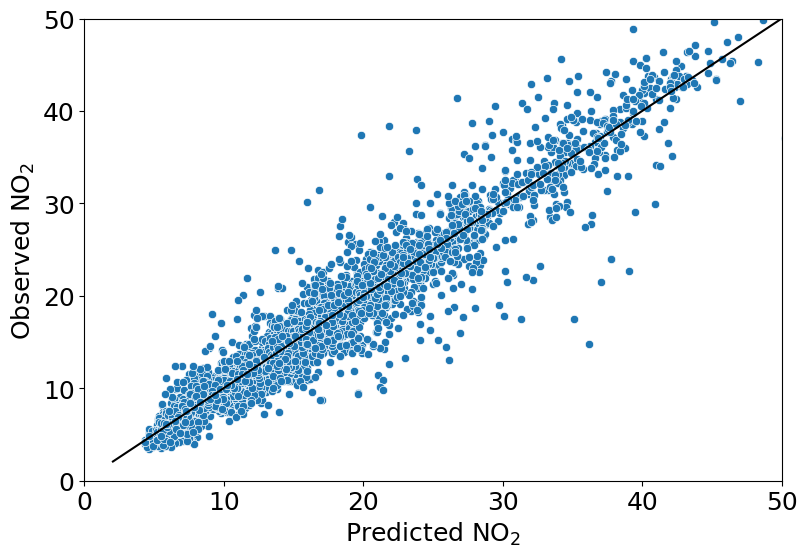

In [431]:
plt.figure(figsize=(9,6))
y_pred = GRID_forest_NO2.predict(X_test_NO2_scale)
pred_summary(y_pred, y_test_NO2, limit=50)
plt.xlabel('Predicted NO$_2$', fontsize = 18); plt.ylabel('Observed NO$_2$', fontsize=18)

In [432]:
# Feature importance
FI_rf_NO2 = pd.DataFrame(GRID_forest_NO2.best_estimator_.feature_importances_, index=X_train_NO2.columns, columns=['Feature Importance (RF)'])
FI_rf_NO2 = FI_rf_NO2.sort_values(by='Feature Importance (RF)',ascending=False)
FI_rf_NO2

,Feature Importance (RF)
closest_mortorway,0.253153
closest_mortorway,0.203028
wind,0.127353
temp,0.075001
road_type_motorway,0.070910
pop_den,0.044488
closest_stops,0.043631
closest_tertiary,0.034434
road_type_residential,0.034346
closest_secondary,0.032616


#### 7.4.3 Ensemble learning - Boosting (GradientBoostingRegressor)

In [433]:
gb_NO2 = GradientBoostingRegressor()
params = {'max_features': [6, 8, 10],
          'learning_rate': [0.05, 0.1, 0.5],
          'n_estimators': [150, 200]}       
GRID_gb_NO2 = GridSearchCV(gb_NO2, params, cv=5, scoring = 'neg_mean_squared_error')
GRID_gb_NO2.fit(X_train_NO2_scale, y_train_NO2)

GridSearchCV(cv=5, estimator=GradientBoostingRegressor(),
             param_grid={'learning_rate': [0.05, 0.1, 0.5],
                         'max_features': [6, 8, 10],
                         'n_estimators': [150, 200]},
             scoring='neg_mean_squared_error')

In [434]:
#Best estimator and CV score
print('Best score (RMSE)', np.sqrt(np.abs(GRID_gb_NO2.best_score_)))
print(GRID_gb_NO2.best_estimator_)

Best score (RMSE) 2.9309805747335207
GradientBoostingRegressor(learning_rate=0.5, max_features=10, n_estimators=200)


RMSE 2.985042701283018
R2 0.887288032153716


Text(0, 0.5, 'Observed NO$_2$')

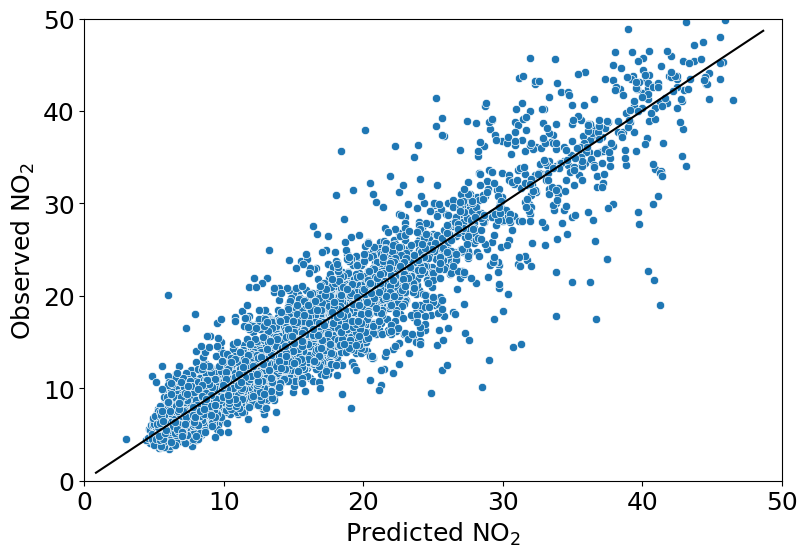

In [437]:
plt.figure(figsize=(9,6))
y_pred = GRID_gb_NO2.predict(X_test_NO2_scale)
pred_summary(y_pred, y_test_NO2, limit=50)
plt.xlabel('Predicted NO$_2$', fontsize = 18); plt.ylabel('Observed NO$_2$', fontsize=18)

In [436]:
# Feature importance
FI_gb_NO2 = pd.DataFrame(GRID_gb_NO2.best_estimator_.feature_importances_, index=X_train_NO2.columns, columns=['Feature Importance (GB)'])
FI_gb_NO2 = FI_gb_NO2.sort_values(by='Feature Importance (GB)',ascending=False)
FI_gb_NO2

,Feature Importance (GB)
road_type_residential,0.265861
road_type_motorway,0.263667
wind,0.127358
closest_mortorway,0.065041
zone_residential,0.059780
temp,0.042683
pop_den,0.036396
closest_stops,0.027693
closest_secondary,0.027623
closest_tertiary,0.023411
